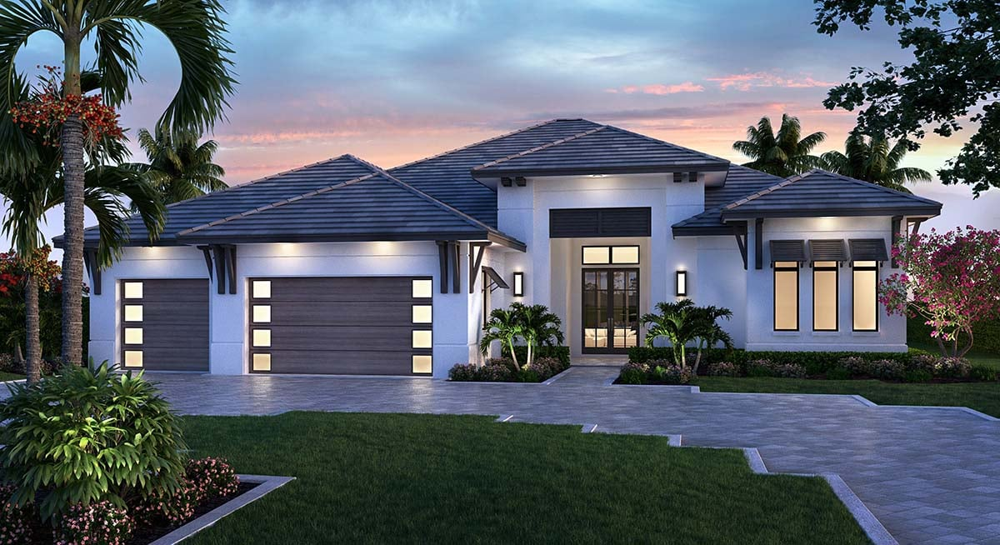

<a id="0"></a>
# <p style="padding:10px;background-color:#1277e1;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;overflow:hidden;font-weight:500">Brief Overview of Dataset</p>

A real estate investor who would like to invest $7.5M dollars in the real estate market. 

They are interested in single family homes or rental apartments unless we recommend other types of real estate which may return maximum profits. 

Their interest is to buy properties, do the upgrades and then rent the properties, however they are also interested in blooming markets where if needed, they can sell the properties quickly.  

We are tasked with providing our real estate investor with what part of the United States they should invest in to receive maximum gains. 

We will also provide our investor with market trends,sale and inventory listing pricing, sqft price of homes, sale and listing ratios, how long properties are on the market before they rent or sell, the average profits they can expect on their properties after paying their mortgage for rentals and whether they should invest now or wait.

Our Team of analysts has selected a tri-state region in the middle of the eastern part of the United States for our analysis, the markets we have selected are Kentucky, North Carolina & Tennessee. 

The analysis is broken out into sections for each state within the tri-state region with a summarization at the bottom with our recommendations. 

<a id="1"></a>
# <p style="padding:10px;background-color:#1277e1;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;overflow:hidden;font-weight:500">Importing Python Libraries</p>

In [1]:
#%matplotlib notebook
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import datetime
from mortgage import Loan


In [2]:
#silencing depreciation warnings for better viewing experience
import warnings
warnings.filterwarnings('ignore')

<a id="2"></a>
# <p style="padding:10px;background-color:#1277e1;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;overflow:hidden;font-weight:500">Loading & Munging Datasets</p>

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 Prior to anaylsis it is important to parse & clean the datasets for analysis.
</div>

In [3]:
#reading the csv files from zillow utilizing Pandas 'read_csv' function

#zhvi is the home value index
zhvi = pd.read_csv("Metro_zhvi_uc_sfrcondo_tier_0.33_0.67_sm_sa_month.csv")

#zhvf is the home value forecast
zhvf = pd.read_csv("Metro_zhvf_growth_uc_sfrcondo_tier_0.33_0.67_sm_sa_month.csv")

#zori is the rental value index
zori = pd.read_csv("Metro_zori_sm_month.csv")

#inventory based datasets
inventory = pd.read_csv("Metro_invt_fs_uc_sfrcondo_sm_month.csv")
new_listings = pd.read_csv("Metro_new_listings_uc_sfrcondo_sm_month.csv")
pending = pd.read_csv("Metro_new_pending_uc_sfrcondo_sm_month.csv")
mean_days_to_pending = pd.read_csv("Metro_mean_doz_pending_uc_sfrcondo_sm_month.csv")
median_days_to_pending = pd.read_csv("Metro_med_doz_pending_uc_sfrcondo_sm_month.csv")

#list and sale price datasets
median_list_price = pd.read_csv("Metro_mlp_uc_sfr_sm_month.csv")
median_sale_price = pd.read_csv("Metro_median_sale_price_uc_sfr_sm_month.csv")
mean_sale_to_list = pd.read_csv("Metro_mean_sale_to_list_uc_sfrcondo_sm_month.csv")
median_sale_to_list = pd.read_csv("Metro_median_sale_to_list_uc_sfrcondo_sm_month.csv")
mean_days_to_close = pd.read_csv("Metro_mean_days_to_close_uc_sfrcondo_sm_month.csv")
median_days_to_close = pd.read_csv("Metro_median_days_to_close_uc_sfrcondo_sm_month.csv")
sold_above_pct = pd.read_csv("Metro_pct_sold_above_list_uc_sfrcondo_sm_month.csv")
sold_below_pct = pd.read_csv("Metro_pct_sold_below_list_uc_sfrcondo_sm_month.csv")

#sale and count datasets
sales_nowcast = pd.read_csv("Metro_sales_count_now_uc_sfrcondo_month.csv")
mean_price_cut = pd.read_csv("Metro_mean_listings_price_cut_amt_uc_sfr_sm_month.csv")
median_price_cut = pd.read_csv("Metro_med_listings_price_cut_amt_uc_sfr_sm_month.csv")
price_cut_pct = pd.read_csv("Metro_perc_listings_price_cut_uc_sfr_sm_month.csv")

In [4]:
#Loading the forecast values for NC
zhvf['StateName'].fillna("US", inplace = True)
zhvf_nc = zhvf.sort_values(by=['2024-04-30'], ascending=False)[(zhvf.StateName == 'NC') | (zhvf.StateName == 'US')]

#Loading zhvi (the home value index) for NC 
zhvi['StateName'].fillna("US", inplace = True)
zhvi_nc = zhvi.sort_values(by=['2023-03-31'], ascending=False)[(zhvi.StateName == 'NC') | (zhvi.StateName == 'US')]

#zori - the rental value index for NC
zori['StateName'].fillna("US", inplace = True)
zori_nc = zori.sort_values(by=['2023-03-31'], ascending=False)[(zori.StateName == 'NC') | (zori.StateName == 'US')]

#we are not going to include the average US data in the inventory data, as value are bery big compared the NC data.
#The count of unique listings that were active at any time in a given month.
inventory_nc = inventory.sort_values(by=['2023-03-31'], ascending=False)[inventory.StateName == 'NC']

#how many new listings have come on the market in a given month.
new_listings_nc = new_listings.sort_values(by=['2023-03-31'], ascending=False)[new_listings.StateName == 'NC']

#How long it takes homes in a region to change to pending status on Zillow.com after first being shownas for sale. 
mean_days_to_pending['StateName'].fillna("US", inplace = True)
mean_days_to_pending_nc = mean_days_to_pending.sort_values(by=['2023-03-31'], ascending=False)[(mean_days_to_pending.StateName == 'NC') | (mean_days_to_pending.StateName == 'US') ]

#Number of days between the listing going pending and the sale date.
mean_days_to_close['StateName'].fillna("US", inplace = True)
mean_days_to_close_nc = mean_days_to_close.sort_values(by=['2023-02-28'], ascending=False)[(mean_days_to_close.StateName == 'NC') | (mean_days_to_close.StateName == 'US')]

#The median price at which homes across various geographies were listed.
median_list_price['StateName'].fillna("US", inplace = True)
median_list_price_nc = median_list_price.sort_values(by=['2023-02-28'], ascending=False)[(median_list_price.StateName == 'NC') | (median_list_price.StateName == 'US')]

#The median price at which homes across various geographies were sold.
median_sale_price['StateName'].fillna("US", inplace = True)
median_sale_price_nc = median_sale_price.sort_values(by=['2023-02-28'], ascending=False)[(median_sale_price.StateName == 'NC') | (median_sale_price.StateName == 'US')] 

#ratio of sale to list price
mean_sale_to_list['StateName'].fillna("US", inplace = True)
mean_sale_to_list_nc = mean_sale_to_list.sort_values(by=['2023-02-28'], ascending=False)[(mean_sale_to_list.StateName == 'NC') | (mean_sale_to_list.StateName == 'US')]

#Ratio of sales where Sale Price is above the final list price; excludes homes sold for exactly the list price.
sold_above_pct['StateName'].fillna("US", inplace = True)
sold_above_pct_nc = sold_above_pct.sort_values(by=['2023-02-28'], ascending=False)[(sold_above_pct.StateName == 'NC') | (sold_above_pct.StateName == 'US')]

#Ratio of sales where Sale Price is below the final list price; excludes homes sold for exactly the list price.
sold_below_pct['StateName'].fillna("US", inplace = True)
sold_below_pct_nc = sold_below_pct.sort_values(by=['2023-02-28'], ascending=False)[(sold_below_pct.StateName == 'NC') | (sold_below_pct.StateName == 'US')]

#the estimated number of unique properties that sold during the month after accounting for the latency between when sales occur and when they are reported
sales_nowcast_nc= sales_nowcast.sort_values(by=['2023-03-31'], ascending=False)[(sales_nowcast.StateName == 'NC') | (sales_nowcast.StateName == 'US')]

#the mean price cut for listings in a given region during a given time period
mean_price_cut['StateName'].fillna("US", inplace = True)
mean_price_cut_nc= mean_price_cut.sort_values(by=['2023-03-31'], ascending=False)[(mean_price_cut.StateName == 'NC') | (mean_price_cut.StateName == 'US')]

'''The number of unique properties with a list price at the end of the month that’s less than the list price at the beginning of the month,
divided by the number of unique properties with an active listing at some point during the month.'''
price_cut_pct['StateName'].fillna("US", inplace = True)
price_cut_pct_nc = price_cut_pct.sort_values(by=['2023-03-31'], ascending=False)[(price_cut_pct.StateName == 'NC') | (price_cut_pct.StateName == 'US')]


In [5]:
'''
For inventory datasets we chose to fill the missing values with 0, and for other the datasets we chose not to drop records with missing values and use them as they are and 
These are the steps we are taking cleaning the data:
- Put the Time columns in a new dataframe and using transpose, convert them into index
- Add the RegionName a column names
- change the index data type to either date or string depending on the application
- changing the ratio to percentages where needed
'''

zhvf_nc_subset = zhvf_nc[zhvf_nc.columns[6:]].T
zhvf_nc_subset.columns = zhvf_nc.RegionName
zhvf_nc_subset.index = zhvf_nc_subset.index.astype(str)

zhvi_nc_subset = zhvi_nc[zhvi_nc.columns[6:]].T
zhvi_nc_subset.columns = zhvi_nc.RegionName
zhvi_nc_subset.index = pd.to_datetime(zhvi_nc_subset.index)

zori_nc_subset = zori_nc[zori_nc.columns[6:]].T
zori_nc_subset.columns = zori_nc.RegionName
zori_nc_subset.index = pd.to_datetime(zori_nc_subset.index)

inventory_nc_cleaned = inventory_nc.fillna(0)
inventory_nc_subset = inventory_nc_cleaned[inventory_nc_cleaned.columns[6:]].T
inventory_nc_subset.columns = inventory_nc_cleaned.RegionName
inventory_nc_subset.index = pd.to_datetime(inventory_nc_subset.index)

new_listings_nc_cleaned = new_listings_nc.fillna(0)
new_listings_nc_subset = new_listings_nc_cleaned[new_listings_nc_cleaned.columns[6:]].T
new_listings_nc_subset.columns = new_listings_nc_cleaned.RegionName
new_listings_nc_subset.index = pd.to_datetime(new_listings_nc_subset.index)

mean_days_to_pending_nc_subset = mean_days_to_pending_nc[mean_days_to_pending_nc.columns[6:]].T
mean_days_to_pending_nc_subset.columns = mean_days_to_pending_nc.RegionName
mean_days_to_pending_nc_subset.index = pd.to_datetime(mean_days_to_pending_nc_subset.index)

mean_days_to_close_nc_subset = mean_days_to_close_nc[mean_days_to_close_nc.columns[6:]].T
mean_days_to_close_nc_subset.columns = mean_days_to_close_nc.RegionName
mean_days_to_close_nc_subset.index = pd.to_datetime(mean_days_to_close_nc_subset.index)

median_list_price_nc_subset = median_list_price_nc[median_list_price_nc.columns[6:]].T
median_list_price_nc_subset.columns = median_list_price_nc.RegionName
median_list_price_nc_subset.index = pd.to_datetime(median_list_price_nc_subset.index)

median_sale_price_nc_subset = median_sale_price_nc[median_sale_price_nc.columns[6:]].T
median_sale_price_nc_subset.columns = median_sale_price_nc.RegionName
median_sale_price_nc_subset.index = pd.to_datetime(median_sale_price_nc_subset.index)

mean_sale_to_list_nc_subset = mean_sale_to_list_nc[mean_sale_to_list_nc.columns[6:]].T
mean_sale_to_list_nc_subset.columns = mean_sale_to_list_nc.RegionName
mean_sale_to_list_nc_subset.index = pd.to_datetime(mean_sale_to_list_nc_subset.index)
mean_sale_to_list_nc_subset = mean_sale_to_list_nc_subset

sold_above_pct_nc_subset =sold_above_pct_nc[sold_above_pct_nc.columns[6:]].T
sold_above_pct_nc_subset.columns = sold_above_pct_nc.RegionName
sold_above_pct_nc_subset.index = pd.to_datetime(sold_above_pct_nc_subset.index)
sold_above_pct_nc_subset = round(sold_above_pct_nc_subset*100)

sold_below_pct_nc_subset =sold_below_pct_nc[sold_below_pct_nc.columns[6:]].T
sold_below_pct_nc_subset.columns = sold_below_pct_nc.RegionName
sold_below_pct_nc_subset.index = pd.to_datetime(sold_below_pct_nc_subset.index)
sold_below_pct_nc_subset = round(sold_below_pct_nc_subset*100)

sales_nowcast_nc_subset = sales_nowcast_nc[sales_nowcast_nc.columns[6:]].T
sales_nowcast_nc_subset.columns = sales_nowcast_nc.RegionName
sales_nowcast_nc_subset.index = pd.to_datetime(sales_nowcast_nc_subset.index)

mean_price_cut_nc_subset = mean_price_cut_nc[mean_price_cut_nc.columns[6:]].T
mean_price_cut_nc_subset.columns = mean_price_cut_nc.RegionName
mean_price_cut_nc_subset.index = pd.to_datetime(mean_price_cut_nc_subset.index)

price_cut_pct_nc_subset = price_cut_pct_nc[price_cut_pct_nc.columns[6:]].T
price_cut_pct_nc_subset.columns = price_cut_pct_nc.RegionName
price_cut_pct_nc_subset.index = pd.to_datetime(price_cut_pct_nc_subset.index)
price_cut_pct_nc_subset = round(price_cut_pct_nc_subset*100)


In [6]:
#setting up Tennessee variations of data
'''In additions to filtering down to Tennesse from Zillow, the datasets required melting to 
tabular format for visualization, I also created a new column, 'year', that allows for broader analysis '''

#US housing index
zhvi_US = zhvi[zhvi.RegionName == 'United States'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='home_value')
zhvi_US['time_period'] = pd.to_datetime(zhvi_US.time_period)

#TN housing index
zhvi_tn = zhvi[(zhvi.StateName == 'TN')].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='home_value')
zhvi_tn['time_period'] = pd.to_datetime(zhvi_tn.time_period)


#US housing forecast
zhvf_US = zhvf[zhvf.RegionName == 'United States'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName','BaseDate'],var_name='time_period',value_name='forecast')
zhvf_US['time_period'] = pd.to_datetime(zhvf_US.time_period)
zhvf_US['forecast'] = zhvf_US['forecast'].astype(int)

#TN housing forecast
zhvf_tn = zhvf[zhvf.StateName == 'TN'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName','BaseDate'],var_name='time_period',value_name='forecast')
zhvf_tn['time_period'] = pd.to_datetime(zhvf_tn.time_period)
zhvf_tn['month_year'] = zhvf_tn['time_period'].dt.to_period('M')
zhvf_tn['month_year'] = zhvf_tn['month_year'].astype(str)
zhvf_tn['forecast'] = zhvf_tn['forecast'].astype(int)

#US rental index
zori_US = zori[zori.RegionName == 'United States'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='rental_cost')
zori_US['time_period'] = pd.to_datetime(zori_US.time_period)

#TN rental index
zori_tn = zori[zori.StateName == 'TN'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='rental_cost')
zori_tn['time_period'] = pd.to_datetime(zori_tn.time_period)

#TN inventory based datasets
inventory_tn = inventory[inventory.StateName == 'TN'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='inventory')
inventory_tn['time_period'] = pd.to_datetime(inventory_tn.time_period)
inventory_tn['year'] = inventory_tn['time_period'].dt.year
inventory_tn['inventory'] = inventory_tn['inventory'].fillna(0)
inventory_tn['inventory'] = inventory_tn['inventory'].astype(int)

new_listings_tn = new_listings[new_listings.StateName == 'TN'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='new_listings')
new_listings_tn['time_period'] = pd.to_datetime(new_listings_tn.time_period)

pending_tn = pending[pending.StateName == 'TN'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='pending')
pending_tn['time_period'] = pd.to_datetime(pending_tn.time_period)

mean_days_to_pending_tn = mean_days_to_pending[mean_days_to_pending.StateName == 'TN'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='mean_days_to_pending')
mean_days_to_pending_tn['time_period'] = pd.to_datetime(mean_days_to_pending_tn.time_period)

median_days_to_pending_tn = median_days_to_pending[median_days_to_pending.StateName == 'TN'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='mdn_days_to_pending')
median_days_to_pending_tn['time_period'] = pd.to_datetime(median_days_to_pending_tn.time_period)

#TN list and sale price datasets
median_list_price_tn = median_list_price[median_list_price.StateName == 'TN'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='mdn_list_price')
median_list_price_tn['time_period'] = pd.to_datetime(median_list_price_tn.time_period)

median_sale_price_tn = median_sale_price[median_sale_price.StateName == 'TN'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='mdn_sale_price')
median_sale_price_tn['time_period'] = pd.to_datetime(median_sale_price_tn.time_period)

mean_sale_to_list_tn = mean_sale_to_list[mean_sale_to_list.StateName == 'TN'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='mean_sale2list_ratio')
mean_sale_to_list_tn['time_period'] = pd.to_datetime(mean_sale_to_list_tn.time_period)
mean_sale_to_list_tn['mean_sale2list_ratio'] = mean_sale_to_list_tn['mean_sale2list_ratio'].fillna(1)
mean_sale_to_list_tn['mean_sale2list_ratio'] = round(mean_sale_to_list_tn['mean_sale2list_ratio']*100)

median_sale_to_list_tn = median_sale_to_list[median_sale_to_list.StateName == 'TN'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='mdn_sale2list_ratio')
median_sale_to_list_tn['time_period'] = pd.to_datetime(median_sale_to_list_tn.time_period)

mean_days_to_close_tn = mean_days_to_close[mean_days_to_close.StateName == 'TN'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='mean_days_to_close')
mean_days_to_close_tn['time_period'] = pd.to_datetime(mean_days_to_close_tn.time_period)

median_days_to_close_tn = median_days_to_close[median_days_to_close.StateName == 'TN'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='mdn_days_to_close')
median_days_to_close_tn['time_period'] = pd.to_datetime(median_days_to_close_tn.time_period)

sold_above_pct_tn = sold_above_pct[sold_above_pct.StateName == 'TN'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='sold_above_pct')
sold_above_pct_tn['time_period'] = pd.to_datetime(sold_above_pct_tn.time_period)
sold_above_pct_tn['sold_above_pct'] = sold_above_pct_tn['sold_above_pct'].fillna(0)
sold_above_pct_tn['sold_above_pct'] = round(sold_above_pct_tn['sold_above_pct']*100)
sold_above_pct_tn['sold_above_pct'] = sold_above_pct_tn['sold_above_pct'].astype(int)

sold_below_pct_tn = sold_below_pct[sold_below_pct.StateName == 'TN'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='sold_below_pct')
sold_below_pct_tn['time_period'] = pd.to_datetime(sold_below_pct_tn.time_period)

#TN sale and count datasets
sales_nowcast_tn = sales_nowcast[sales_nowcast.StateName == 'TN'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='sales_nowcast')
sales_nowcast_tn['time_period'] = pd.to_datetime(sales_nowcast_tn.time_period)

mean_price_cut_tn = mean_price_cut[mean_price_cut.StateName == 'TN'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='mean_price_cut')
mean_price_cut_tn['time_period'] = pd.to_datetime(mean_price_cut_tn.time_period)

median_price_cut_tn = median_price_cut[median_price_cut.StateName == 'TN'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='mdn_price_cut')
median_price_cut_tn['time_period'] = pd.to_datetime(median_price_cut_tn.time_period)

price_cut_pct_tn = price_cut_pct[price_cut_pct.StateName == 'TN'].melt(id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='price_cut_pct')
price_cut_pct_tn['time_period'] = pd.to_datetime(price_cut_pct_tn.time_period)
price_cut_pct_tn['price_cut_pct'] = price_cut_pct_tn['price_cut_pct'].fillna(0)
price_cut_pct_tn['price_cut_pct'] = round(price_cut_pct_tn['price_cut_pct']*100)
price_cut_pct_tn['price_cut_pct'] = price_cut_pct_tn['price_cut_pct'].astype(int)

In [7]:
# Housing index
zhvi_melt = pd.melt(zhvi, id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='home_value')
zhvi_melt['year'] = zhvi_melt['time_period'].str[:4]
zhvi_melt['home_value'] = zhvi_melt['home_value'].astype(float)

# Housing forecast
zhvf_melt = pd.melt(zhvf, id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName','BaseDate'],var_name='time_period',value_name='forecast')
zhvf_melt['year'] = zhvf_melt['time_period'].str[:4]
zhvf_melt['forecast'] = zhvf_melt['forecast'].astype(float)

# Rental index
zori_melt = pd.melt(zori, id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='rental_cost')
zori_melt['year'] = zori_melt['time_period'].str[:4]
zori_melt['rental_cost'] = zori_melt['rental_cost'].astype(float)

# Inventory
inventory_melt = pd.melt(inventory, id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='inventory')
inventory_melt['year'] = inventory_melt['time_period'].str[:4]
inventory_melt['inventory'] = inventory_melt['inventory'].fillna(0)
inventory_melt['inventory'] = inventory_melt['inventory'].astype(float)

new_listings_melt = pd.melt(new_listings, id_vars=['RegionID','SizeRank','RegionName','RegionType','StateName'],var_name='time_period',value_name='new_listings')
new_listings_melt['year'] = new_listings_melt['time_period'].str[:4]
new_listings_melt['new_listings'] = new_listings_melt['new_listings'].astype(float)


<p style="padding:10px;background-color:#b32134;margin:0;color:#ffffff;font-family:newtimeroman;font-size:200%;text-align:center;overflow:hidden;font-weight:500">What part of the country to invest for a maximum gain? (Rent)</p>

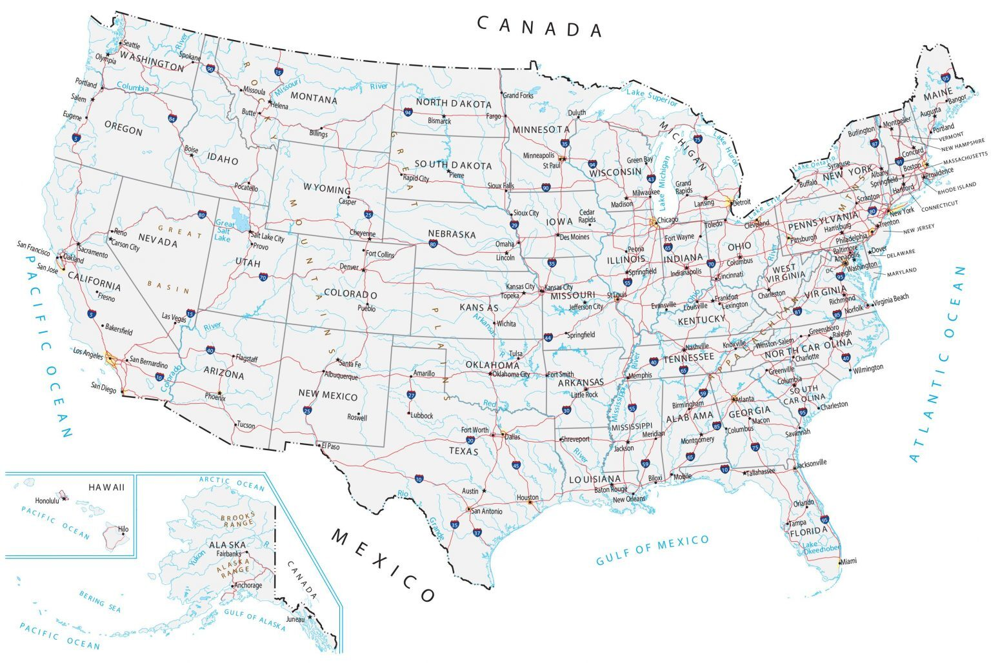

credit: GISGeography

<p style="padding:10px;margin:0;font-family:newtimeroman;font-size:120%;overflow:hidden;font-weight:500">1. Rental cost to Home value (RH) Rate</p>
<p style="padding:10px;margin:0;font-family:newtimeroman;font-size:120%;overflow:hidden;font-weight:500">2. Home Value Forecast - in Top Tier RH Rate Region</p>
<p style="padding:10px;margin:0;font-family:newtimeroman;font-size:120%;overflow:hidden;font-weight:500">3. New Listing Rate (Inventory) - in Top Tier Forecast Region, in Top Tier RH Rate</p>
<p style="padding:10px;margin:0;font-family:newtimeroman;font-size:120%;overflow:hidden;font-weight:500">4. RH Trend - of Recommended cities</p>
<p style="padding:10px;margin:0;font-family:newtimeroman;font-size:120%;overflow:hidden;font-weight:500">5. Expected Profit</p>

<p style="padding:10px;background-color:#b32134;margin:0;color:#ffffff;font-family:newtimeroman;font-size:150%;text-align:center;overflow:hidden;font-weight:500">1. Rental cost to Home value (RH) Rate</p>

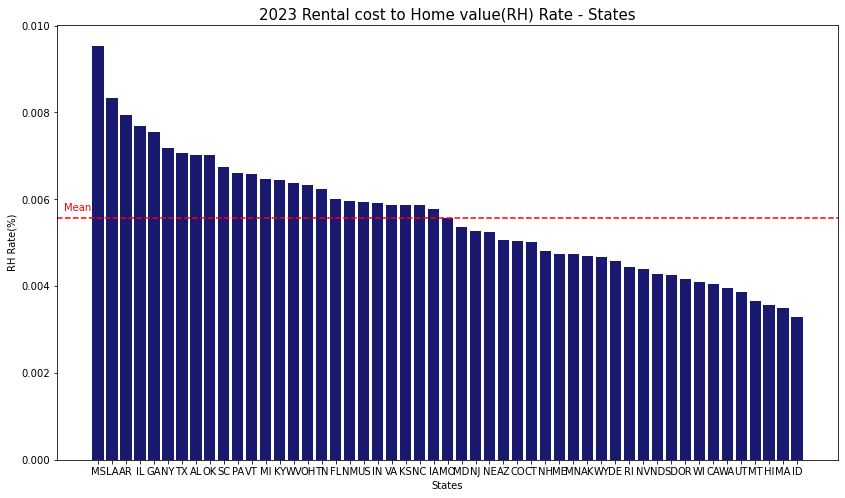

In [8]:
# zhvi 2023 mean by state
zhvi_2023_mean_state = zhvi_melt[zhvi_melt.year == '2023'].groupby(['StateName']).mean()

# zori 2023 mean by state
zori_2023_mean_state = zori_melt[zori_melt.year == '2023'].groupby(['StateName']).mean()

# Join zhvi & zori and calculate rental cost to home value rate
rh_rate_state = zhvi_2023_mean_state.join(zori_2023_mean_state, lsuffix='_zhvi', rsuffix='_zori')[['home_value','rental_cost']]
rh_rate_state['rental_cost_rate'] = rh_rate_state['rental_cost'] / rh_rate_state['home_value']

# Plot - 2023 rental cost to home value rate by state
rh_rate_state_sorted = rh_rate_state.sort_values(by='rental_cost_rate', ascending=False)

ax1 = plt.figure(figsize=(14,8))
ax1 = plt.bar(rh_rate_state_sorted.index,rh_rate_state_sorted['rental_cost_rate'],color='midnightblue')

# set the title and axis labels
plt.title('2023 Rental cost to Home value(RH) Rate - States',fontsize=15)
plt.xlabel('States')
plt.ylabel('RH Rate(%)')

# RH rate mean
rh_rate_state_total_mean = rh_rate_state['rental_cost_rate'].mean()
plt.axhline(y=rh_rate_state_total_mean, c='r', linestyle='--')
plt.text(x=-.5,y=rh_rate_state_total_mean*1.03,s='Mean',fontsize=10, ha='right', c='r')

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 Mississippi has the highest rental cost to home value (RH) rate over the country, followed by Louisiana and Arkansas. But the region(city) level approach can be more practical because state level data covers too broad range of real estate situation. 
</div>

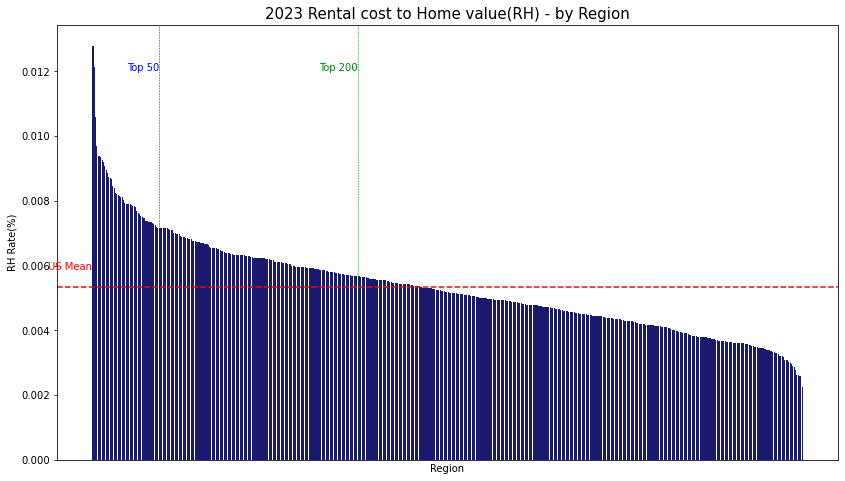

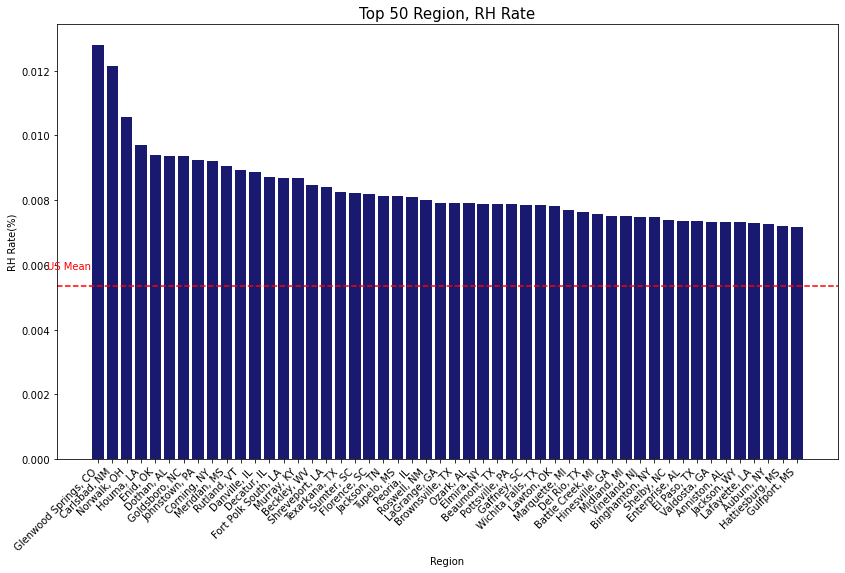

In [9]:
# zhvi 2023 by city region
zhvi_2023_mean_region = zhvi_melt[zhvi_melt.year == '2023'].groupby(['RegionName']).mean()

# zori 2023 by city region
zori_2023_mean_region = zori_melt[zori_melt.year == '2023'].groupby(['RegionName']).mean()

# Join zhvi & zori and calculate rental cost to home value rate
rh_rate_city = zhvi_2023_mean_region.join(zori_2023_mean_region, lsuffix='_zhvi', rsuffix='_zori')[['home_value','rental_cost']]
rh_rate_city['rental_cost_rate'] = rh_rate_city['rental_cost'] / rh_rate_city['home_value']

# Plot - 2023 rental cost to home value rate by city region
rh_rate_city_sorted = rh_rate_city.sort_values(by='rental_cost_rate', ascending=False)

ax1 = plt.figure(figsize=(14,8))
ax1 = plt.bar(rh_rate_city_sorted.index,rh_rate_city_sorted['rental_cost_rate'],color='midnightblue')

# set the title and axis labels
plt.title('2023 Rental cost to Home value(RH) - by Region',fontsize=15)
plt.xlabel('Region')
plt.ylabel('RH Rate(%)')
plt.xticks([])

# US mean
rh_rate_city_total_mean = rh_rate_city['rental_cost_rate'].mean()
plt.axhline(y=rh_rate_city_total_mean, c='r', linestyle='--')
plt.text(x=-.5,y=rh_rate_city_total_mean*1.1,s='US Mean',fontsize=10, ha='right', c='r')

# Top 50
plt.axvline(x=50, c='b', linestyle='--', linewidth=.5)
plt.text(x=50,y=rh_rate_city_total_mean * 2.25,s='Top 50',fontsize=10, ha='right', c='b')

# Top 200
plt.axvline(x=200, c='g', linestyle='--', linewidth=.5)
plt.text(x=200,y=rh_rate_city_total_mean * 2.25,s='Top 200',fontsize=10, ha='right', c='g')

# Plot - 2023 top 50 region of rental cost to home value rate
rh_rate_city_top_50 = rh_rate_city_sorted.head(50)

ax2 = plt.figure(figsize=(14,8))
ax2 = plt.bar(rh_rate_city_top_50.index,rh_rate_city_top_50['rental_cost_rate'],color='midnightblue')

# set the title and axis labels
plt.title('Top 50 Region, RH Rate',fontsize=15)
plt.xlabel('Region')
plt.ylabel('RH Rate(%)')
plt.xticks(rotation=45, ha='right')

# rate mean
plt.axhline(y=rh_rate_city_total_mean, c='r', linestyle='--')
plt.text(x=-.5,y=rh_rate_city_total_mean*1.1,s='US Mean',fontsize=10, ha='right', c='r')


# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 About 200 cities are above the US mean RH rate. And the cities ranked on the higher position, are relatively small cities, for example, Glenwood Springs, CO which is a resort city - Population: 10,000, Total households: 3,700.
</div>

<p style="padding:10px;background-color:#b32134;margin:0;color:#ffffff;font-family:newtimeroman;font-size:150%;text-align:center;overflow:hidden;font-weight:500">2. Home Value Forecast in Top 200 RH Rate Region</p>

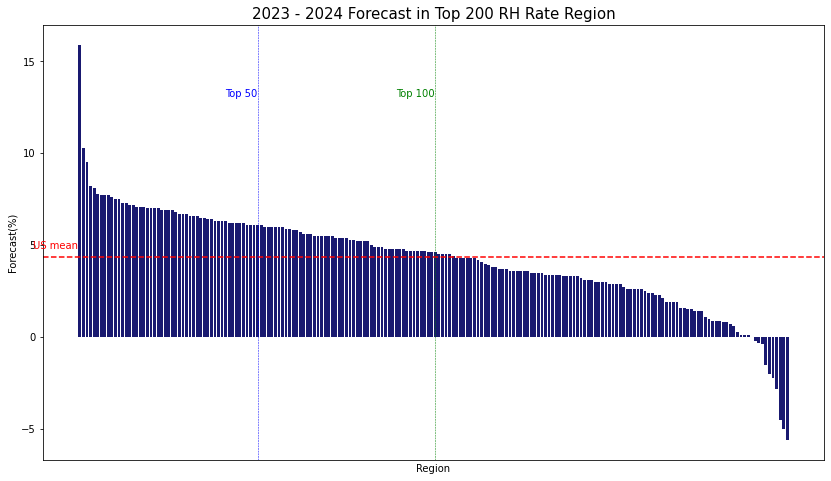

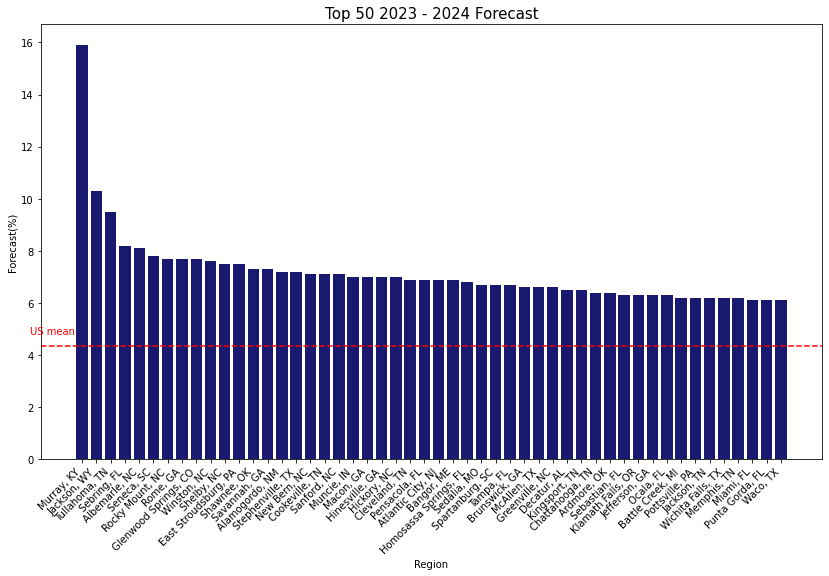

In [10]:
# List up RH rate top tier regions
rh_rate_top_tier = list(rh_rate_city_sorted.head(200).index)

# Filter out other regions
top_tier_mask = zhvf_melt['RegionName'].isin(rh_rate_top_tier)
zhvf_melt_top_tier = zhvf_melt[top_tier_mask]

# Sort by year and set index to RegionName
zhvf_melt_top_tier_sorted = zhvf_melt_top_tier[zhvf_melt_top_tier['year'] == '2024'].sort_values(by='forecast', ascending=False)
zhvf_melt_top_tier_sorted = zhvf_melt_top_tier_sorted.set_index('RegionName')

# Calculate overall US mean
us_forecast_mean = zhvf_melt[zhvf_melt['year'] == '2024']['forecast'].mean()

# Plot
ax1 = plt.figure(figsize=(14,8))
ax1 = plt.bar(zhvf_melt_top_tier_sorted.index,zhvf_melt_top_tier_sorted['forecast'],color='midnightblue')

# set the title and axis labels
plt.title('2023 - 2024 Forecast in Top 200 RH Rate Region',fontsize=15)
plt.xlabel('Region')
plt.ylabel('Forecast(%)')
plt.xticks([])

# US mean
plt.axhline(y=us_forecast_mean, c='r', linestyle='--')
plt.text(x=-.5,y=us_forecast_mean*1.1,s='US mean',fontsize=10, ha='right', c='r')

# Top 50 line
plt.axvline(x=50, c='b', linestyle='--', linewidth=.5)
plt.text(x=50,y=us_forecast_mean * 3,s='Top 50',fontsize=10, ha='right', c='b')

# Top 100 line
plt.axvline(x=100, c='g', linestyle='--', linewidth=.5)
plt.text(x=100,y=us_forecast_mean * 3,s='Top 100',fontsize=10, ha='right', c='g')


# Top 100
zhvf_melt_top_tier_sorted_cut = zhvf_melt_top_tier_sorted.head(50)
# Plot
ax2 = plt.figure(figsize=(14,8))
ax2 = plt.bar(zhvf_melt_top_tier_sorted_cut.index,zhvf_melt_top_tier_sorted_cut['forecast'],color='midnightblue')

# set the title and axis labels
plt.title('Top 50 2023 - 2024 Forecast',fontsize=15)
plt.xlabel('Region')
plt.ylabel('Forecast(%)')
plt.xticks(rotation=45, ha='right')

# US mean
plt.axhline(y=us_forecast_mean, c='r', linestyle='--')
plt.text(x=-.5,y=us_forecast_mean*1.1,s='US mean',fontsize=10, ha='right', c='r')


# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 2023-2024 forecast data (in top 200 RH rate region) shows that about top 100 cities are forecasting above the US mean.
</div>

<p style="padding:10px;background-color:#b32134;margin:0;color:#ffffff;font-family:newtimeroman;font-size:150%;text-align:center;overflow:hidden;font-weight:500">3. Inventory - in Top 100 Forecast Region (in Top 200 RH Rate)</p>

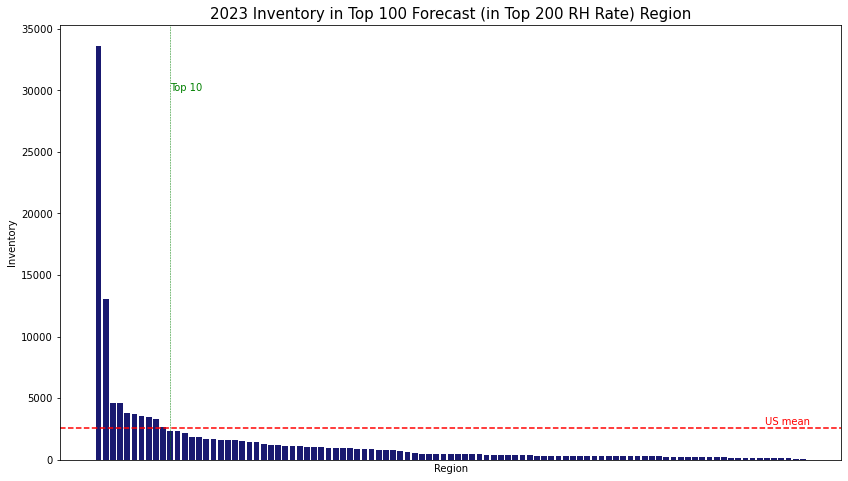

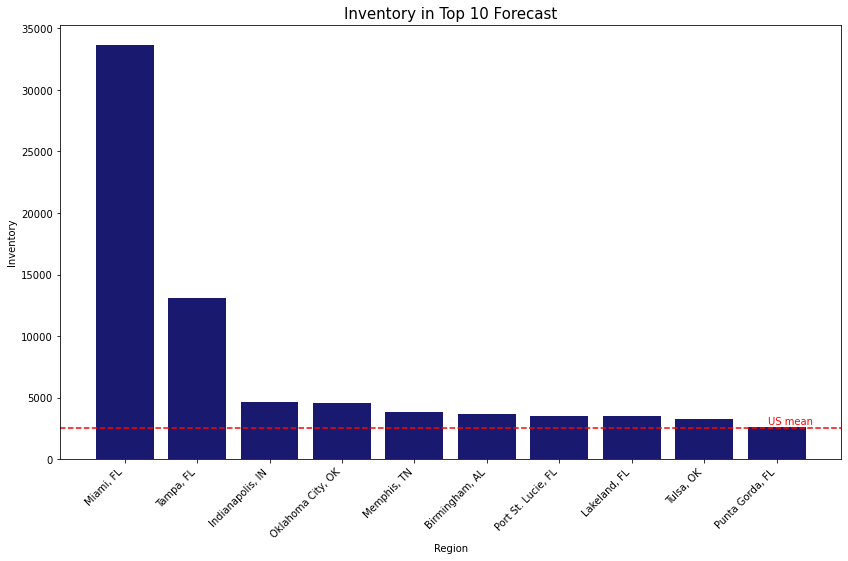

In [11]:
# List up RH rate top tier regions
forecast_top_tier = list(zhvf_melt_top_tier_sorted.head(100).index)

# Filter out regions below top 50 rental cost to home value rate
top_tier_mask_inv = inventory_melt['RegionName'].isin(forecast_top_tier)
top_tier_inventory = inventory_melt[top_tier_mask_inv]

# Sort by time_period and set index to RegionName
top_tier_inv = top_tier_inventory[top_tier_inventory['time_period']=='2023-04-30'].sort_values(by='inventory', ascending=False)
top_tier_inv = top_tier_inv.set_index('RegionName')
top_tier_inv = top_tier_inv.drop('United States')

# Calculate overall US mean
us_inv_mean = inventory_melt['inventory'].mean()

# Plot
ax1 = plt.figure(figsize=(14,8))
ax1 = plt.bar(top_tier_inv.index,top_tier_inv['inventory'],color='midnightblue')

# set the title and axis labels
plt.title('2023 Inventory in Top 100 Forecast (in Top 200 RH Rate) Region',fontsize=15)
plt.xlabel('Region')
plt.ylabel('Inventory')
plt.xticks([])

# US mean
plt.axhline(y=us_inv_mean, c='r', linestyle='--')
plt.text(x=top_tier_inv.index.size,y=us_inv_mean*1.1,s='US mean',fontsize=10, ha='right', c='r')

# Top 10 line
plt.axvline(x=10, c='g', linestyle='--', linewidth=.5)
plt.text(x=10,y=30000,s='Top 10',fontsize=10, ha='left', c='g')

# Top 10
top_tier_inv_cut = top_tier_inv.head(10)

# Plot - Top 10
ax2 = plt.figure(figsize=(14,8))
ax2 = plt.bar(top_tier_inv_cut.index,top_tier_inv_cut['inventory'],color='midnightblue')

# set the title and axis labels
plt.title('Inventory in Top 10 Forecast',fontsize=15)
plt.xlabel('Region')
plt.ylabel('Inventory')
plt.xticks(rotation=45, ha='right')

# US mean
plt.axhline(y=us_inv_mean, c='r', linestyle='--')
plt.text(x=top_tier_inv_cut.index.size*0.95,y=us_inv_mean*1.1,s='US mean',fontsize=10, ha='right', c='r')


# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 2023 inventory data (in top 100 forecast & top 200 RH rate) proves that the majority number of cities are relatively small cities which have lower number of inventory.
</div>

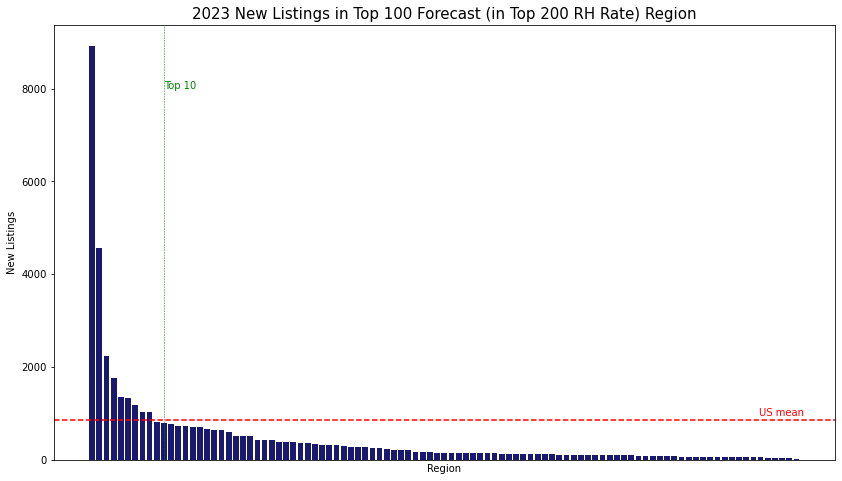

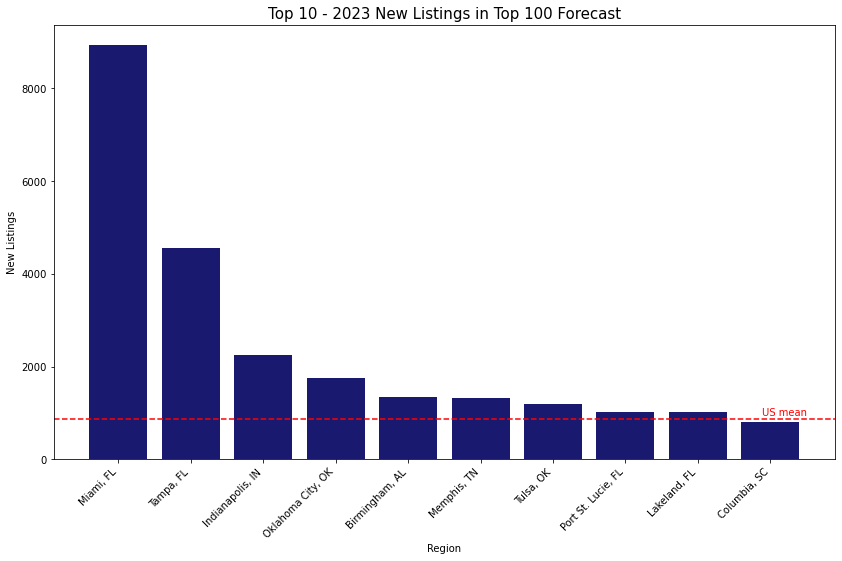

In [12]:
# List up RH rate top tier regions
forecast_top_tier = list(zhvf_melt_top_tier_sorted.head(100).index)

# Filter out regions below top 50 rental cost to home value rate
top_tier_mask_new_list = new_listings_melt['RegionName'].isin(forecast_top_tier)
top_tier_new_listings = new_listings_melt[top_tier_mask_new_list]

# Sort by time_period and set index to RegionName
top_tier_new_list = top_tier_new_listings[top_tier_new_listings['time_period']=='2023-04-30'].sort_values(by='new_listings', ascending=False)
top_tier_new_list = top_tier_new_list.set_index('RegionName')
top_tier_new_list = top_tier_new_list.drop('United States')

# Calculate overall US mean
us_new_list_mean = new_listings_melt['new_listings'].mean()

# Plot
ax1 = plt.figure(figsize=(14,8))
ax1 = plt.bar(top_tier_new_list.index,top_tier_new_list['new_listings'],color='midnightblue')

# set the title and axis labels
plt.title('2023 New Listings in Top 100 Forecast (in Top 200 RH Rate) Region',fontsize=15)
plt.xlabel('Region')
plt.ylabel('New Listings')
plt.xticks([])

# US mean
plt.axhline(y=us_new_list_mean, c='r', linestyle='--')
plt.text(x=top_tier_new_list.index.size,y=us_new_list_mean*1.1,s='US mean',fontsize=10, ha='right', c='r')

# Top 10 line
plt.axvline(x=10, c='g', linestyle='--', linewidth=.5)
plt.text(x=10,y=8000,s='Top 10',fontsize=10, ha='left', c='g')

# Plot - Top 10
top_tier_new_list_cut = top_tier_new_list.head(10)
ax2 = plt.figure(figsize=(14,8))
ax2 = plt.bar(top_tier_new_list_cut.index,top_tier_new_list_cut['new_listings'],color='midnightblue')

# set the title and axis labels
plt.title('Top 10 - 2023 New Listings in Top 100 Forecast',fontsize=15)
plt.xlabel('Region')
plt.ylabel('New Listings')
plt.xticks(rotation=45, ha='right')

# US mean
plt.axhline(y=us_new_list_mean, c='r', linestyle='--')
plt.text(x=top_tier_new_list_cut.index.size*0.95,y=us_new_list_mean*1.1,s='US mean',fontsize=10, ha='right', c='r')

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 2023 new listings data (in top 100 forecast & top 200 RH rate) also proves that the majority number of cities are relatively small cities which have lower number of new listings as well. Let's join those two dataframes.
</div>

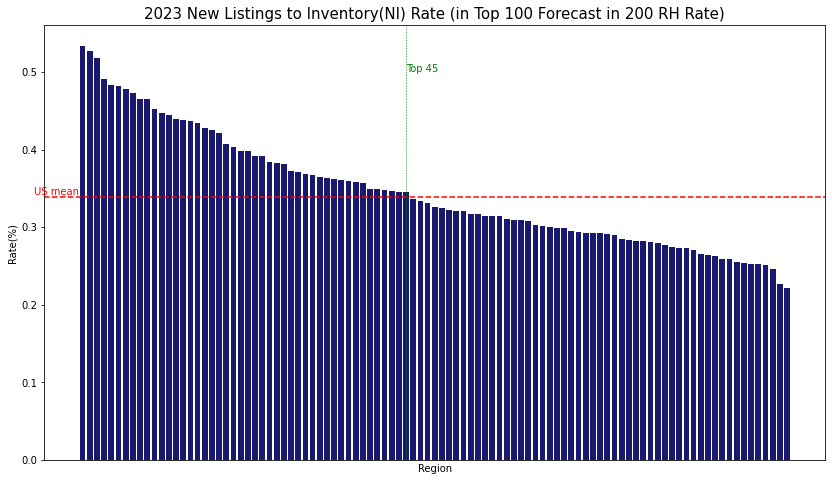

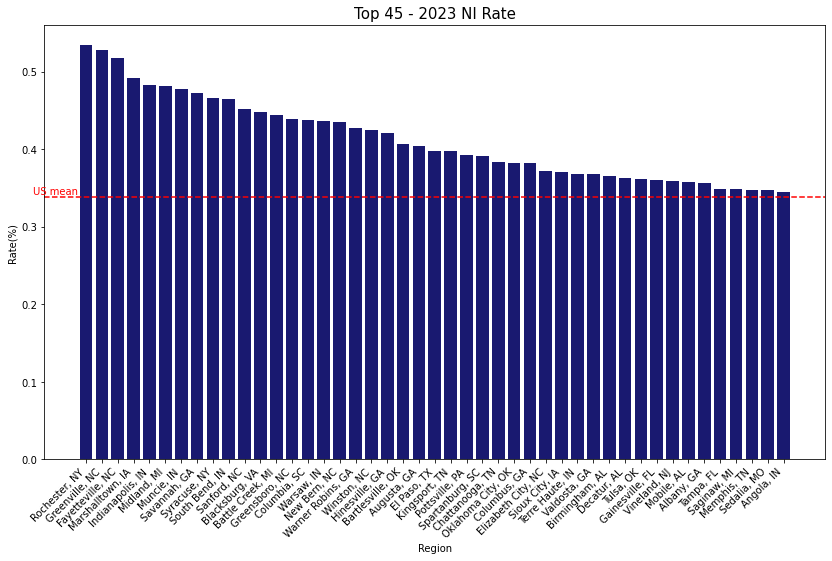

In [13]:
# Join inventory and new listings
top_tier_new_inv_rate = top_tier_inv.join(top_tier_new_list, lsuffix='_inv', rsuffix='_new')
top_tier_new_inv_rate['new_list_rate'] = top_tier_new_inv_rate['new_listings'] / top_tier_new_inv_rate['inventory']
top_tier_new_inv_rate = top_tier_new_inv_rate[['inventory','new_listings','new_list_rate']].sort_values(by='new_list_rate',ascending=False)

us_new_list_rate_mean = new_listings_melt['new_listings'].mean() / inventory_melt['inventory'].mean()

# Plot
ax1 = plt.figure(figsize=(14,8))
ax1 = plt.bar(top_tier_new_inv_rate.index,top_tier_new_inv_rate['new_list_rate'],color='midnightblue')

# set the title and axis labels
plt.title('2023 New Listings to Inventory(NI) Rate (in Top 100 Forecast in 200 RH Rate)',fontsize=15)
plt.xlabel('Region')
plt.ylabel('Rate(%)')
plt.xticks([])

# US mean
plt.axhline(y=us_new_list_rate_mean, c='r', linestyle='--')
plt.text(x=-.5,y=us_new_list_rate_mean*1.01,s='US mean',fontsize=10, ha='right', c='r')

# Top 45 line
plt.axvline(x=45, c='g', linestyle='--', linewidth=.5)
plt.text(x=45,y=0.5,s='Top 45',fontsize=10, ha='left', c='g')

# Top 45
top_tier_new_inv_rate_cut = top_tier_new_inv_rate.head(45)

# Plot
ax2 = plt.figure(figsize=(14,8))
ax2 = plt.bar(top_tier_new_inv_rate_cut.index,top_tier_new_inv_rate_cut['new_list_rate'],color='midnightblue')

# set the title and axis labels
plt.title('Top 45 - 2023 NI Rate',fontsize=15)
plt.xlabel('Region')
plt.ylabel('Rate(%)')
plt.xticks(rotation=45, ha='right')

# US mean
plt.axhline(y=us_new_list_rate_mean, c='r', linestyle='--')
plt.text(x=-.5,y=us_new_list_rate_mean*1.01,s='US mean',fontsize=10, ha='right', c='r')

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 Calculated the 2023 new listings to inventory rate (in top 100 forecast in top 200 RH rate region). It shows that 45 cities are above the US mean rate.
</div>

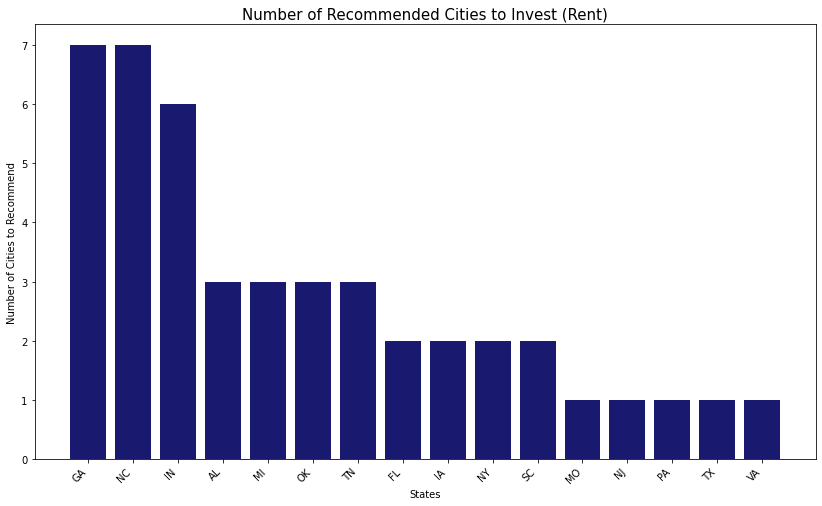

Cities in NC:  Columbus, Valdosta, Savannah, Augusta, Hinesville, Warner Robins, Albany
Cities in GA:  New Bern, Winston, Sanford, Fayetteville, Greenville, Elizabeth City, Greensboro
Cities in IN:  Angola, Warsaw, South Bend, Muncie, Indianapolis, Terre Haute


In [14]:
# Top 45 NI rate cities (in top 100 forecast in top 200 RH rate region)
top_ni = top_tier_new_inv_rate_cut.head(45)
top_ni = top_ni.reset_index()
top_ni[['RegionName','StateName']] = top_ni['RegionName'].str.split(", ", 1, expand=True)
top_ni = top_ni.sort_values(by='StateName').set_index(['RegionName'])
top_ni_state = top_ni['StateName'].value_counts()

# Plot
ax1 = plt.figure(figsize=(14,8))
ax1 = plt.bar(top_ni_state.index,top_ni_state.values,color='midnightblue')

# set the title and axis labels
plt.title('Number of Recommended Cities to Invest (Rent)',fontsize=15)
plt.xlabel('States')
plt.ylabel('Number of Cities to Recommend')
plt.xticks(rotation=45, ha='right')

# show the plot
plt.show()

print("Cities in NC: ", str(list(top_ni[top_ni['StateName'] == 'GA'].index))[1:-1].replace('\'', ''))
print("Cities in GA: ", str(list(top_ni[top_ni['StateName'] == 'NC'].index))[1:-1].replace('\'', ''))
print("Cities in IN: ", str(list(top_ni[top_ni['StateName'] == 'IN'].index))[1:-1].replace('\'', ''))

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 NC and GA includes more recommended cities, followed Indiana. Pass on these 45 cities next to analyze the trend and to calculate the expected profit.
</div>

<p style="padding:10px;background-color:#b32134;margin:0;color:#ffffff;font-family:newtimeroman;font-size:150%;text-align:center;overflow:hidden;font-weight:500">4. RH(Rental cost to Home value) Trend</p>

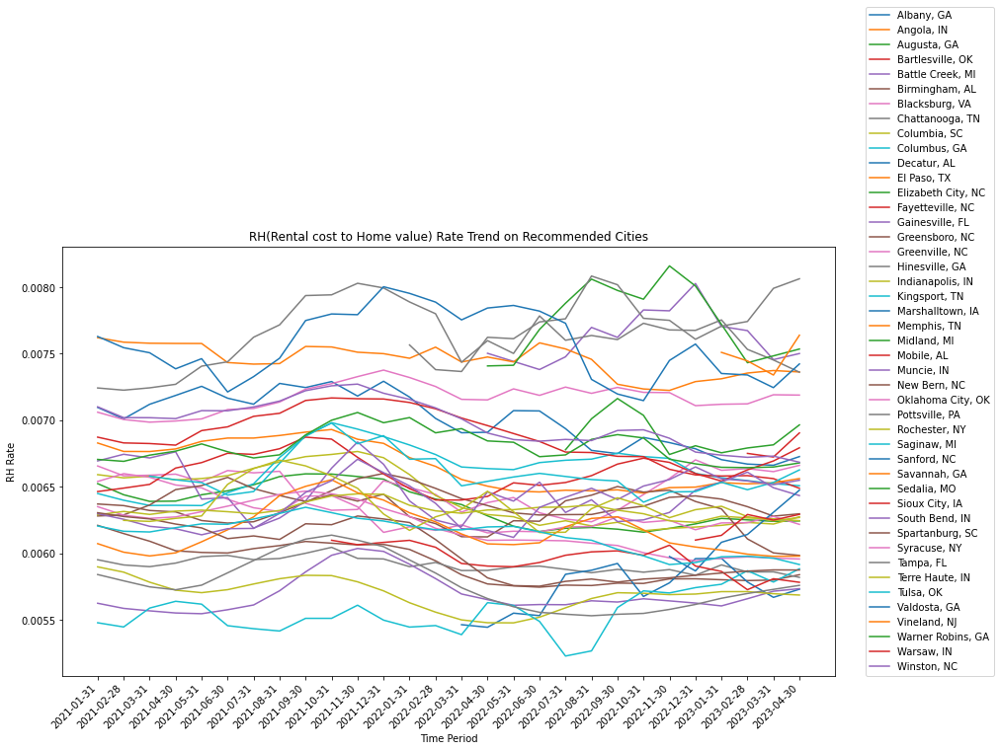

In [15]:
# List of 45 cities from above
recommended_cities = list(top_tier_new_inv_rate_cut.head(45).index)

# Filter out regions by 45 cities
recommended_city_mask = zhvi_melt['RegionName'].isin(recommended_cities)
zhvi_filtered = zhvi_melt[recommended_city_mask]
zhvi_filtered = zhvi_filtered.set_index('RegionName')
recommended_city_mask = zori_melt['RegionName'].isin(recommended_cities)
zori_filtered = zori_melt[recommended_city_mask]
zori_filtered = zori_filtered.set_index('RegionName')

# Filter the most recent data (2021 - 2023)
year_mask = zhvi_filtered['year'].isin(['2021','2022','2023'])
zhvi_filtered_recent = zhvi_filtered[year_mask]
year_mask = zori_filtered['year'].isin(['2021','2022','2023'])
zori_filtered_recent = zori_filtered[year_mask]

rh_rate_trend = zhvi_filtered_recent.merge(zori_filtered_recent, how = 'inner', left_on=['RegionName','time_period'], right_on=['RegionName','time_period'])

rh_rate_trend['rh_rate'] = rh_rate_trend['rental_cost'] / rh_rate_trend['home_value']

rh_rate_trend= rh_rate_trend.dropna(subset = ['rental_cost'])

# Plot
regions = rh_rate_trend.groupby('RegionName')
fig, ax1 = plt.subplots(figsize=(14,8))
for idx, region in regions:
    ax1.plot(region['time_period'], region['rh_rate'], label=idx)

# set the title and axis labels
plt.title('RH(Rental cost to Home value) Rate Trend on Recommended Cities')
plt.xlabel('Time Period')
plt.ylabel('RH Rate')
plt.xticks(rotation=45, ha='right')

# add a legend
plt.legend(loc=(1.04, 0))

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 RH(Rental cost to home value) rate of the 45 cities are trending pretty much stable in last 2 years except for a couple of fluctuation.
</div>

<p style="padding:10px;background-color:#b32134;margin:0;color:#ffffff;font-family:newtimeroman;font-size:150%;text-align:center;overflow:hidden;font-weight:500">5. Expected Profit</p>

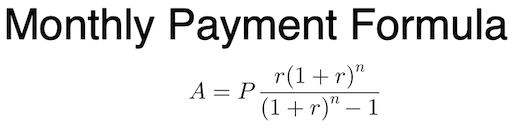

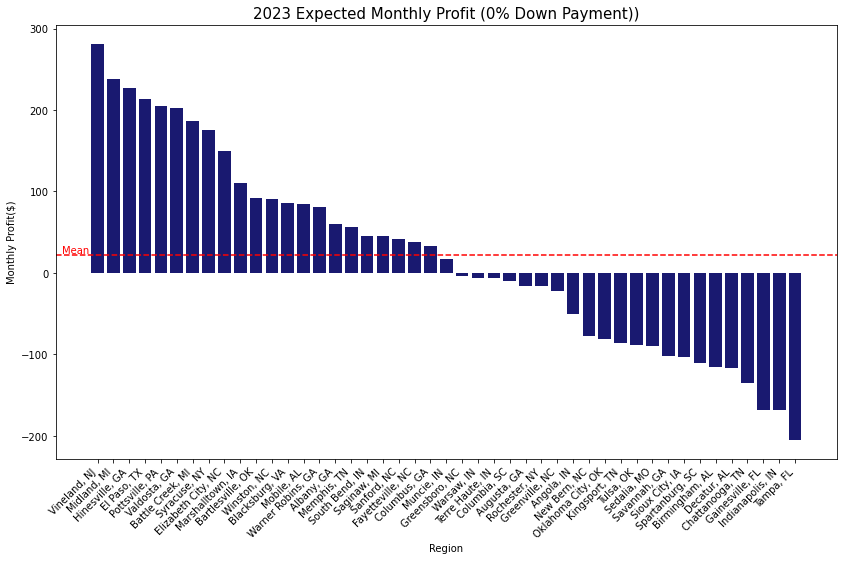

In [16]:
# Filter 2023-04-30 data only
year_mask = rh_rate_trend['time_period'].isin(['2023-04-30'])
rh_rate_trend_current = rh_rate_trend[year_mask]

# Calculate mortgage monthly payment based on 30-year fixed interest: 6.49%
interest = 0.0649 / 12
period = 30 * 12
mortgage_formula = interest * pow(1+interest, period) / (pow(1+interest, period)-1)

rh_rate_trend_current['monthly_profit_0_down'] = rh_rate_trend_current['rental_cost'] - rh_rate_trend_current['home_value'] * mortgage_formula
rh_rate_trend_current['monthly_profit_30_down'] = rh_rate_trend_current['rental_cost'] - (rh_rate_trend_current['home_value']*0.7) * mortgage_formula

rh_rate_trend_current_sorted = rh_rate_trend_current.sort_values(by='monthly_profit_0_down', ascending=False)

monthly_profit_mean = rh_rate_trend_current_sorted['monthly_profit_0_down'].mean()

# Plot - monthly expected profit - 0% down payment
ax1 = plt.figure(figsize=(14,8))
ax1 = plt.bar(rh_rate_trend_current_sorted.index,rh_rate_trend_current_sorted['monthly_profit_0_down'],color='midnightblue')

# Set the title and axis labels
plt.title('2023 Expected Monthly Profit (0% Down Payment))',fontsize=15)
plt.xlabel('Region')
plt.ylabel('Monthly Profit($)')
plt.xticks(rotation=45, ha='right')

# Mean
plt.axhline(y=monthly_profit_mean, c='r', linestyle='--')
plt.text(x=-.5,y=monthly_profit_mean*1.1,s='Mean',fontsize=10, ha='right', c='r')

# Show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 Some cities shows negative monthly profit on 0% down payment. But at the same time, 0% down payment does not make sense because the investor has a seed money. Let's see the case of 30% down payment.
</div>

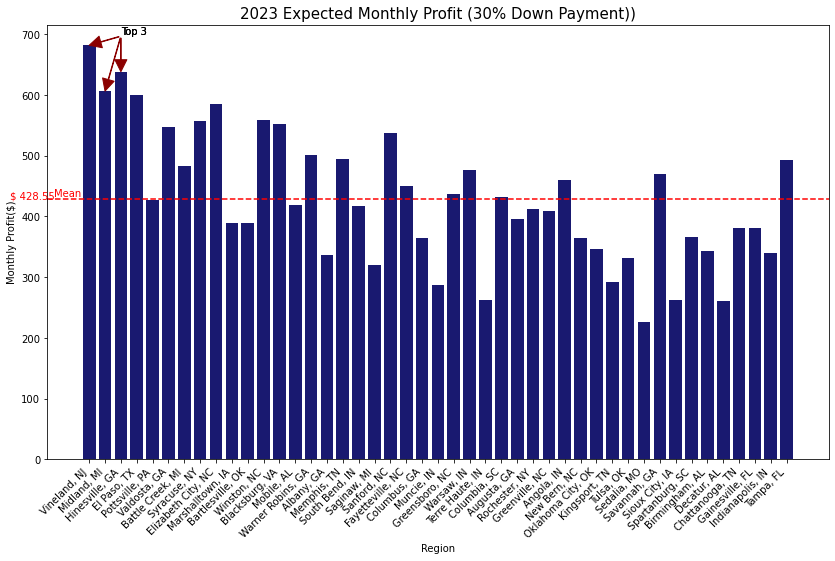

In [17]:
# Monthly profit with 30% down payment
monthly_profit_mean = rh_rate_trend_current_sorted['monthly_profit_30_down'].mean()

# Plot - monthly expected profit - 30% down payment
fig1, ax1 = plt.subplots(figsize=(14,8))
ax1.bar(rh_rate_trend_current_sorted.index,rh_rate_trend_current_sorted['monthly_profit_30_down'],color='midnightblue')

# set the title and axis labels
plt.title('2023 Expected Monthly Profit (30% Down Payment))',fontsize=15)
plt.xlabel('Region')
plt.ylabel('Monthly Profit($)')
plt.xticks(rotation=45, ha='right')

# Mean
plt.axhline(y=monthly_profit_mean, c='r', linestyle='--')
plt.text(x=-.5,y=monthly_profit_mean*1.01,s='Mean',fontsize=10, ha='right', c='r')
mean_str = str('$ ' + str(round(monthly_profit_mean,2)))
plt.text(x=-2.2,y=monthly_profit_mean,s=mean_str,fontsize=10, ha='right', c='r')

sort_by_profit = rh_rate_trend_current_sorted.sort_values(by='monthly_profit_30_down', ascending=False)
top1_profit = sort_by_profit.iloc[0]['monthly_profit_30_down']
top3_profit = sort_by_profit.iloc[1]['monthly_profit_30_down']
top2_profit = sort_by_profit.iloc[2]['monthly_profit_30_down']
        
ax1.annotate('Top 3', xy=(0, top1_profit), xytext=(2, 700), arrowprops=dict(fc='darkred', ec = 'darkred', width=.5))
ax1.annotate('Top 3', xy=(1, top2_profit), xytext=(2, 700), arrowprops=dict(fc='darkred', ec = 'darkred', width=.5))
ax1.annotate('Top 3', xy=(2, top3_profit), xytext=(2, 700), arrowprops=dict(fc='darkred', ec = 'darkred', width=.5))

plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 With 30% of down payment, the investor may strategically spread the investment and the risk. Let's pick top 3 cities and calculate the expected monthly profit.
</div>

In [18]:
# Top 3 monthly profit with 30% down payment
top3_cities = list(rh_rate_trend_current_sorted.sort_values(by='monthly_profit_30_down').tail(3).index)

# investment seed: $7.5M
investment_seed = 7500000
home_value_sum = 0
for city in top3_cities:
    home_value_sum += rh_rate_trend_current_sorted.loc[city]['home_value']
home_value_mean = home_value_sum / len(top3_cities)

print(f'Investment Seed: $ {investment_seed:,.2f}')
print(f'Home Value Mean: $ {home_value_mean:,.2f}')

monthly_profit_sum = 0
for city in top3_cities:
    monthly_profit_sum += rh_rate_trend_current_sorted.loc[city]['monthly_profit_30_down']
monthly_profit_mean = monthly_profit_sum / len(top3_cities)

expected_monthly_profit = (investment_seed / home_value_mean) * monthly_profit_mean
print(f'Expected Monthly Profit: $ {expected_monthly_profit:,.2f}')

Investment Seed: $ 7,500,000.00
Home Value Mean: $ 207,787.06
Expected Monthly Profit: $ 23,175.97


<p style="padding:10px;margin:0;font-family:newtimeroman;font-size:150%;overflow:hidden;font-weight:700">Expected Monthly Profit: $ 23,175.97</p>

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 After analyzing the rental cost to house value rate, using the 2023-24 forecasting data, taking into consideration of the new listing rate, applying 30% down payment to spread the risk, and selecting three specific cities, the expected monthly profit was estimated to be approximately $23k, before tax.
</div>

<a id="14"></a>
# <p style="padding:10px;background-color:#1277e1;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;overflow:hidden;font-weight:500">North Carolina Analysis</p>

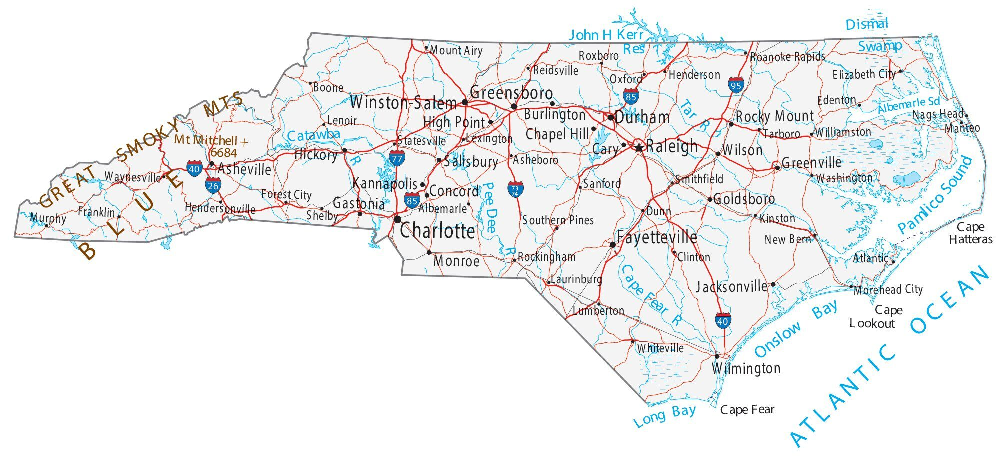

credit: GISGeography

<a id="14"></a>
# <p style="padding:10px;background-color:#7BAFD4;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;overflow:hidden;font-weight:500">Home Value & Rental Trends</p>

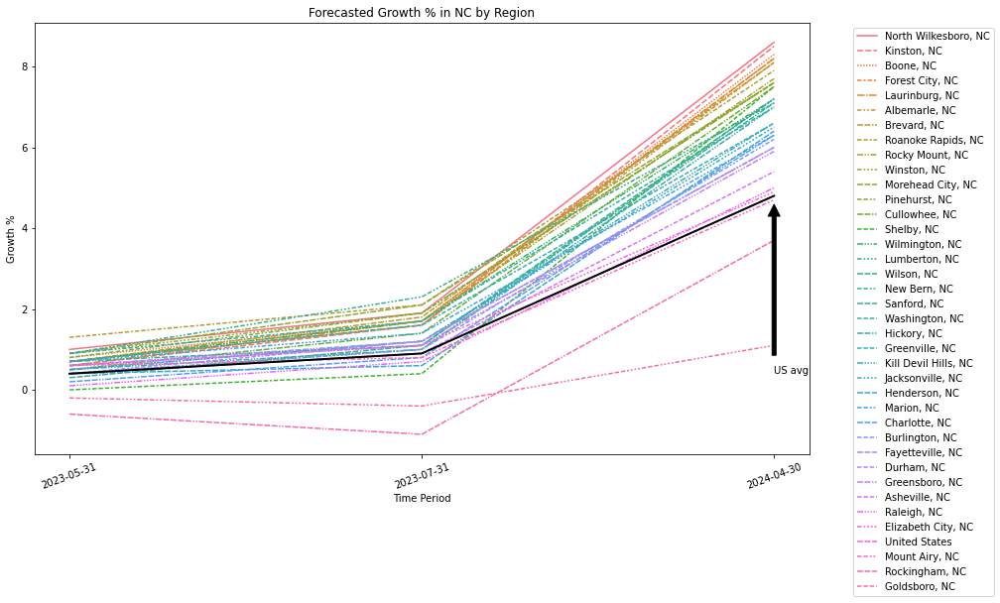

In [19]:
#plotting the forecasted growth in NC
fig, ax = plt.subplots(figsize= (14,8))
plt.title("Forecasted Growth % in NC by Region")
plt.xlabel("Time Period")
plt.ylabel("Growth %")
plt.xticks(rotation = 20)
sns.lineplot(data= zhvf_nc_subset)
#overlaying the US data over the NC data
x1 = zhvf_nc_subset.index
y1= zhvf_nc_subset['United States']
ax.plot(x1, y1, linewidth=2, color='black')
ax.annotate('US avg', xy=(x1[-1], y1[-1]), xytext=(x1[-1], y1[-3]), arrowprops=dict(facecolor='black', shrink=0.05))

plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')

plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 💡 Compared to the average forecast home value index for the whole country, in NC the majority of regions have a higher forecasted home value index. NC has only one city projected to drop its home value(Goldsboro) by April 30th, 2024
</div>

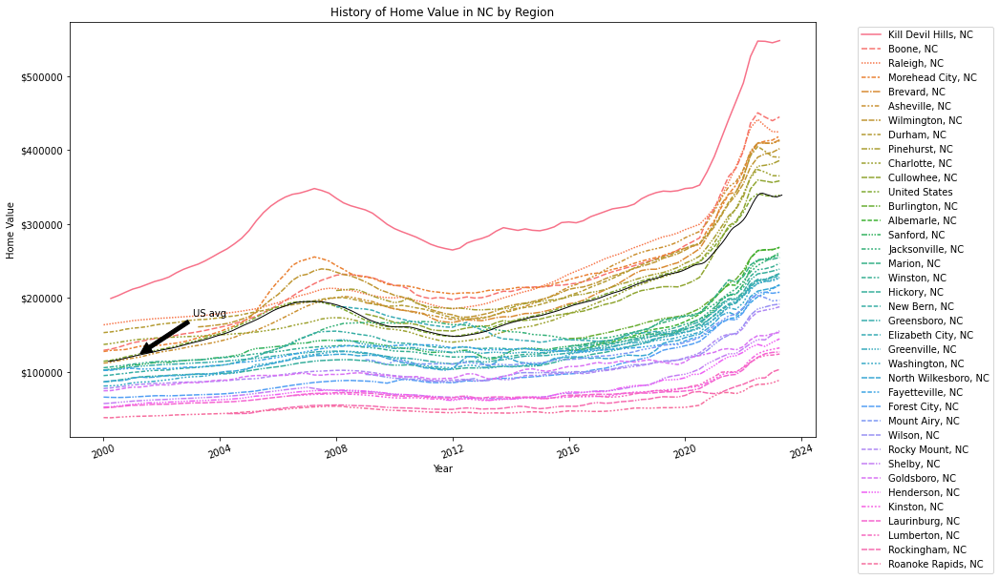

In [20]:
#for plotting purposes, we are going to use quarterly values
#ploting Home value index change with time in the past
zhvi_nc_qtr = zhvi_nc_subset.resample("QS-JAN").mean()
fig, ax = plt.subplots(figsize= (14,8))
ax.yaxis.set_major_formatter('${x:1.0f}')
plt.title("History of Home Value in NC by Region")
plt.xlabel("Year")
plt.ylabel("Home Value")

#overlaying the US data over the NC data
x1 = zhvi_nc_subset.index
y1= zhvi_nc_subset['United States']
plt.xticks(rotation = 20)
sns.lineplot(data= zhvi_nc_qtr)
ax.plot(x1, y1, linewidth=1, color='black')
ax.annotate('US avg', xy=(x1[12], y1[12]), xytext=(x1[35], y1[105]), arrowprops=dict(facecolor='black', shrink=0.05))

plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')

plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 💡 Beginning in 2021, the home value in NC has been increasing. in 2023, We can see that value of these houses is between \$50,000 and \$450,000. There is one outlier region(Kill Devil Hill) which is way expensinve than the rest of the cities.Compared to the US average, we have about 60% of regions with are less expensinve than the US average.
</div>

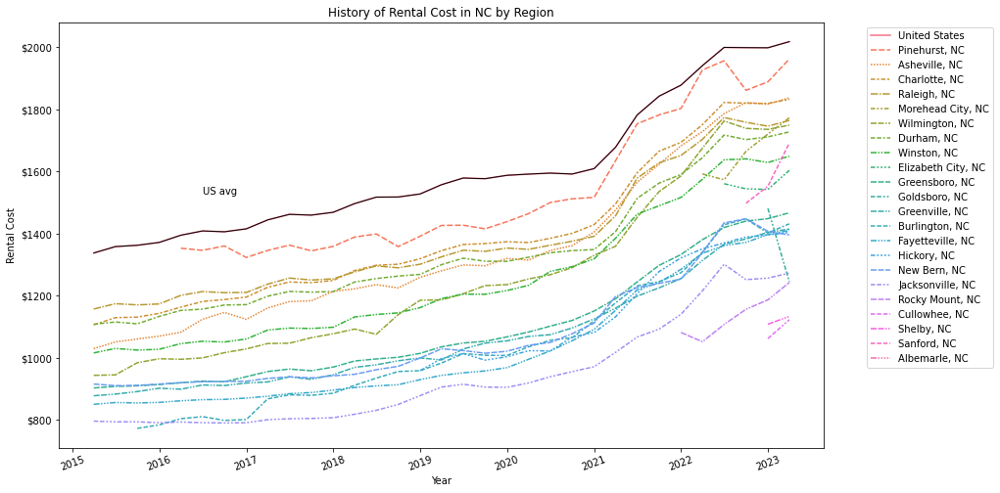

In [21]:
#Plotting zori change with time
zori_nc_qtr = zori_nc_subset.resample("QS-JAN").mean()
fig, ax = plt.subplots(figsize= (14,8))
ax.yaxis.set_major_formatter('${x:1.0f}')
plt.title("History of Rental Cost in NC by Region")
plt.xlabel("Year")
plt.ylabel("Rental Cost")
#overlaying the US data over the NC data
x1 = zori_nc_qtr.index
y1= zori_nc_qtr['United States']
plt.xticks(rotation = 20)
sns.lineplot(data= zori_nc_qtr)
ax.plot(x1, y1, linewidth=1, color='black')
ax.annotate('US avg', xy=(x1[2], y1[2]), xytext=(x1[5], y1[15]))

plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')

plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 💡Same with the Home value in NC, the rental cost increased in mid 2021. It's ranging between \$1000 and \$1800, which is below the average US rental cost.

</div>

<a id="14"></a>
# <p style="padding:10px;background-color:#7BAFD4;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;overflow:hidden;font-weight:500">Inventory Data Analysis</p>


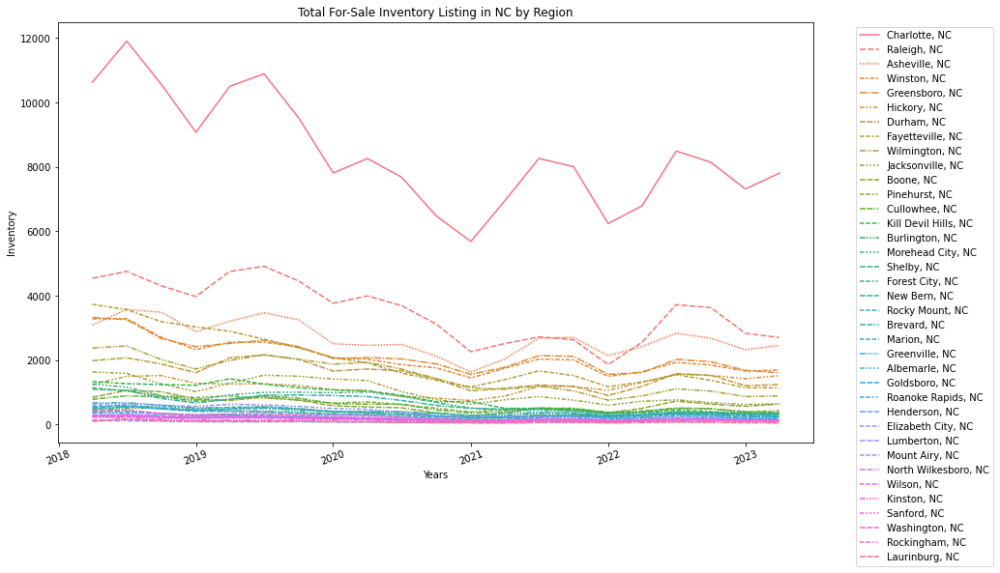

In [22]:
#Plotting the count of unique listings that were active at any time in a given month.
inventory_nc_qtr = inventory_nc_subset.resample("QS-JAN").mean()
fig = plt.subplots(figsize= (14,8))
plt.title("Total For-Sale Inventory Listing in NC by Region")
plt.xlabel("Years")
plt.ylabel("Inventory")
plt.xticks(rotation = 20)
sns.lineplot(data= inventory_nc_qtr)
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')

plt.show()

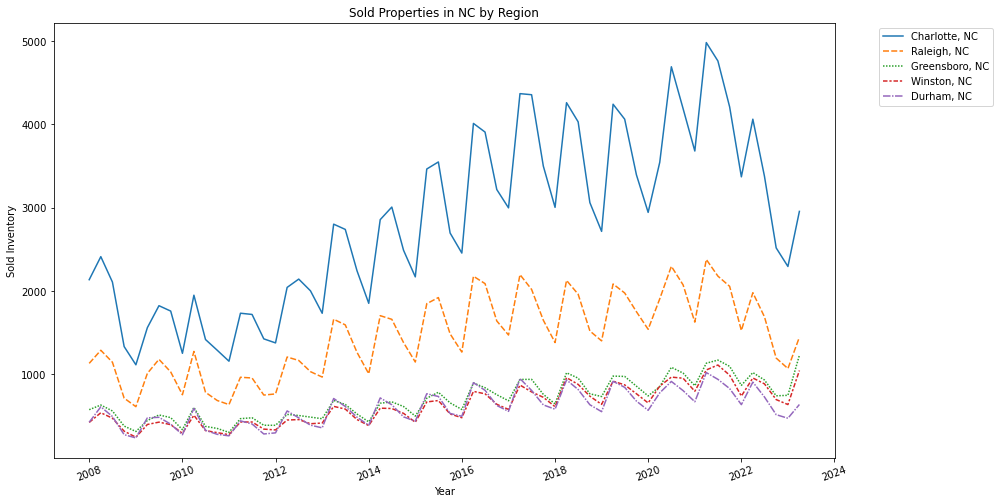

In [23]:
#sold Properties in NC
sales_nowcast_nc_qtr = sales_nowcast_nc_subset.resample("QS-JAN").mean()
fig = plt.subplots(figsize= (14,8))
plt.title("Sold Properties in NC by Region")
plt.xlabel("Year")
plt.ylabel("Sold Inventory")
plt.xticks(rotation = 20)
sns.lineplot(data= sales_nowcast_nc_qtr)
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')

plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 💡Even though we didn't have records for all the regions in NC for sold inventory, but from the 5 regions we have records for, we can see that the amaount of sold properties increased with time. Also compared to the total listings, we can see that 50% or more of properties are being sold at in a given period.

</div>

<a id="14"></a>
# <p style="padding:10px;background-color:#7BAFD4;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;overflow:hidden;font-weight:500">Sales Activity Trends</p>

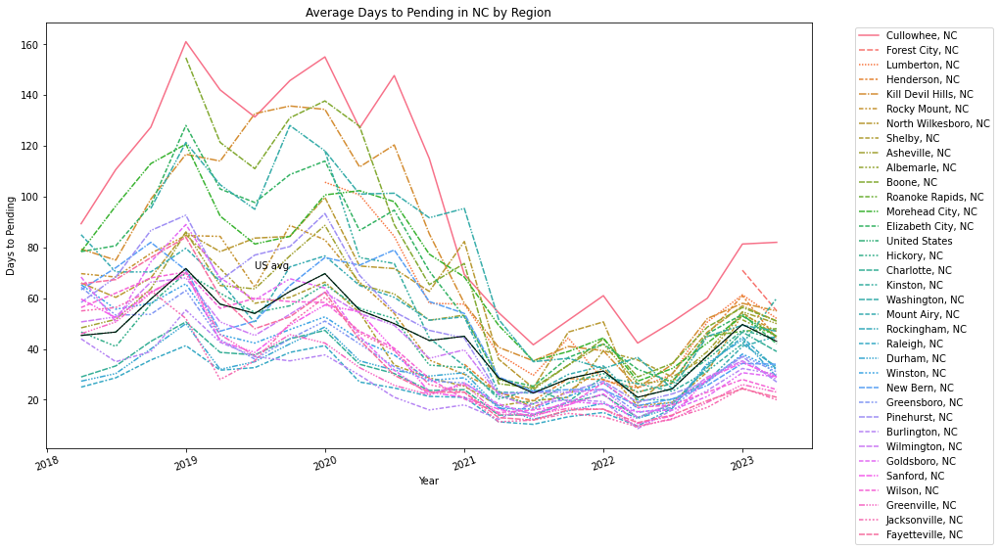

In [24]:
#Plotting how long it takes homes in a region to change to pending status 
mean_days_to_pending_nc_qtr = mean_days_to_pending_nc_subset.resample("QS-JAN").mean()
fig, ax = plt.subplots(figsize= (14,8))
plt.title("Average Days to Pending in NC by Region")
plt.xlabel("Year")
plt.ylabel("Days to Pending")
plt.xticks(rotation = 20)
sns.lineplot(data= mean_days_to_pending_nc_qtr)
#overlaying the US data over the NC data
x1 = mean_days_to_pending_nc_qtr.index
y1= mean_days_to_pending_nc_qtr['United States']
ax.plot(x1, y1, linewidth=1, color='black')
ax.annotate('US avg', xy=(x1[2], y1[2]), xytext=(x1[5], y1[3]))

plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')

plt.show()

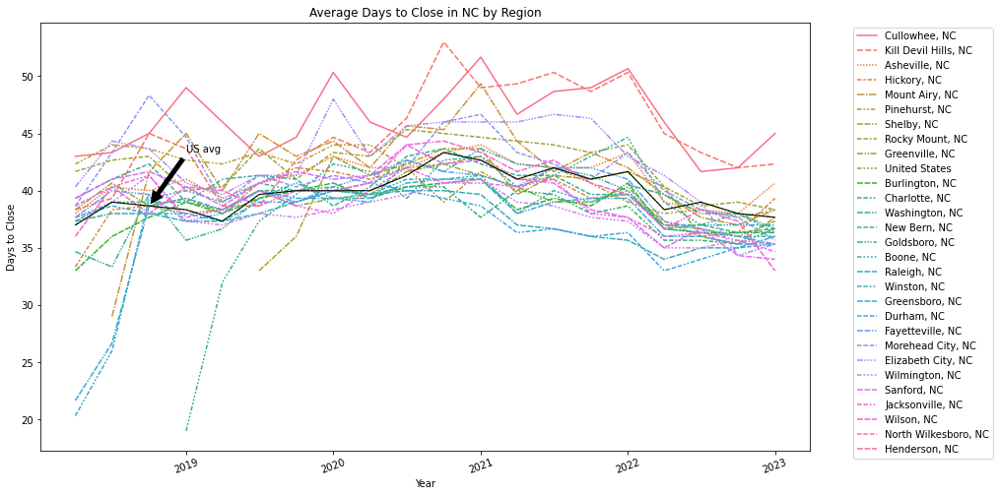

In [25]:
#Plotting how many days between the listing going pending and the sale date.
mean_days_to_close_nc_qtr = mean_days_to_close_nc_subset.resample("QS-JAN").mean()
fig, ax = plt.subplots(figsize= (14,8))
plt.title("Average Days to Close in NC by Region")
plt.xlabel("Year")
plt.ylabel("Days to Close")
plt.xticks(rotation = 20)
sns.lineplot(data= mean_days_to_close_nc_qtr)
#overlaying the US data over the NC data
x1 = mean_days_to_close_nc_qtr.index
y1= mean_days_to_close_nc_qtr['United States']
ax.plot(x1, y1, linewidth=1, color='black')
ax.annotate('US avg', xy=(x1[2], y1[2]), xytext=(x1[3], y1[10]), arrowprops=dict(facecolor='black', shrink=0.05))
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')

plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 💡In 2023, on average it takes between 20 and 80 days to change to pending status and between 33 and 45 to change from pending to close, In each case, the majority of the regions in NC have a change period less that the average US value. Which is showing us how fast we can sell the properties if we decide to sell.

</div>

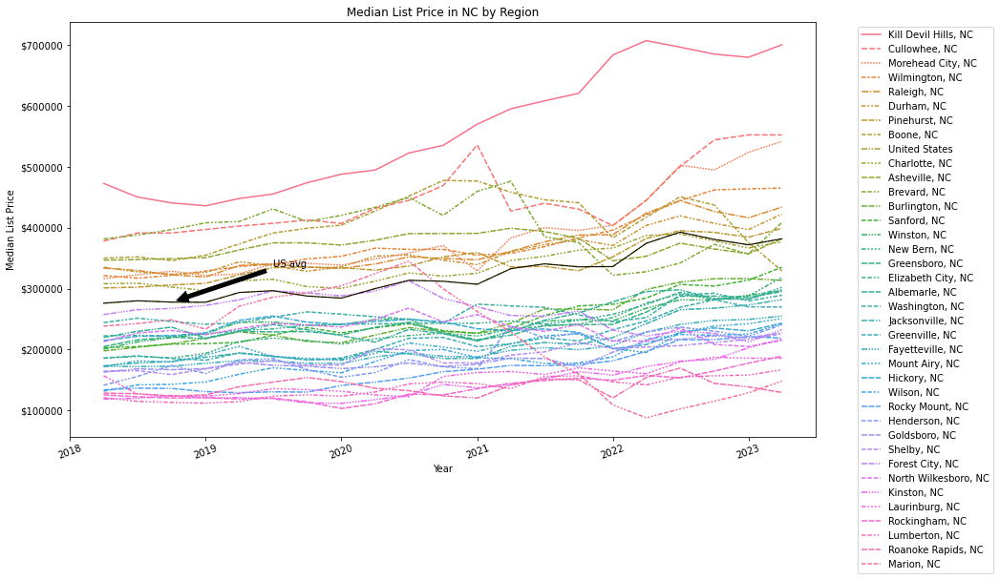

In [26]:
#Plotting the median_list_price_nc
median_list_price_nc_qtr = median_list_price_nc_subset.resample("QS-JAN").mean()
fig, ax = plt.subplots(figsize= (14,8))
ax.yaxis.set_major_formatter('${x:1.0f}')
plt.title("Median List Price in NC by Region")
plt.xlabel("Year")
plt.ylabel("Median List Price")
plt.xticks(rotation = 20)
sns.lineplot(data= median_list_price_nc_qtr)
#overlaying the US data over the NC data
x1 = median_list_price_nc_qtr.index
y1= median_list_price_nc_qtr['United States']
ax.plot(x1, y1, linewidth=1, color='black')
ax.annotate('US avg', xy=(x1[2], y1[2]), xytext=(x1[5], y1[15]), arrowprops=dict(facecolor='black', shrink=0.05))
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')

plt.show()

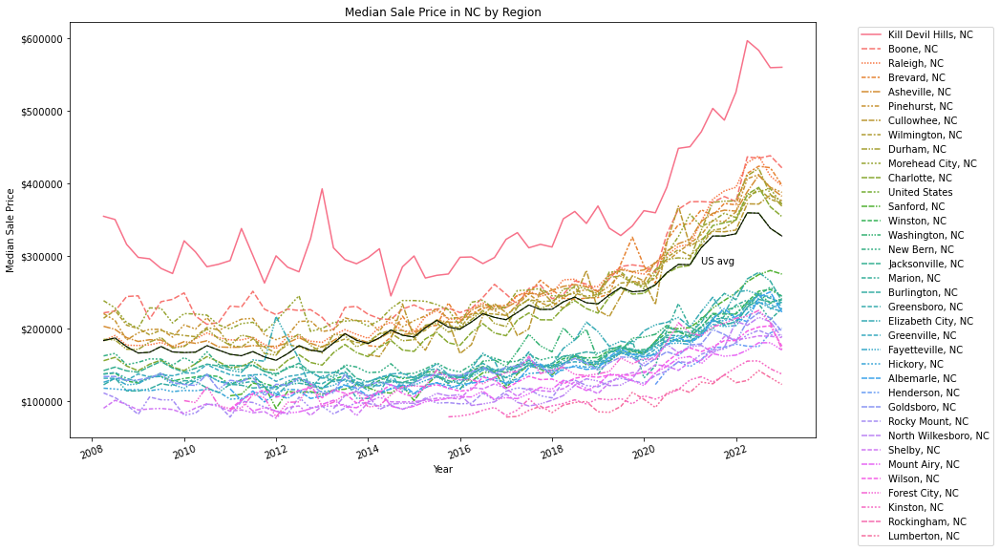

In [27]:
#Plotting the median_sale_price_nc
median_sale_price_nc_qtr = median_sale_price_nc_subset.resample("QS-JAN").mean()
fig, ax = plt.subplots(figsize= (14,8))
ax.yaxis.set_major_formatter('${x:1.0f}')
plt.title("Median Sale Price in NC by Region")
plt.xlabel("Year")
plt.ylabel("Median Sale Price")
plt.xticks(rotation = 20)
sns.lineplot(data= median_sale_price_nc_qtr)
#overlaying the US data over the NC data
x1 = median_sale_price_nc_qtr.index
y1= median_sale_price_nc_qtr['United States']
ax.plot(x1, y1, linewidth=1, color='black')
ax.annotate('US avg', xy=(x1[-1], y1[-1]), xytext=(x1[-8], y1[-10]))
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')

plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 💡Comparing the list and the sale price, we can see that the list price has remained about the same with time, but the sale price has increased significantly starting 2021 with 11 regions selling higher that the US average. This shows how homes in NC increased in Value. 

</div>

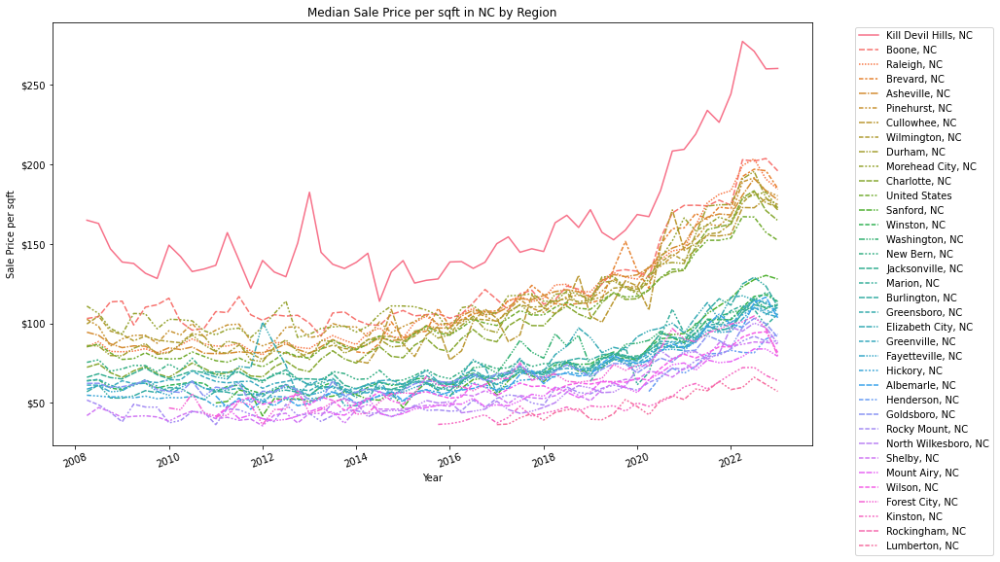

In [28]:

'''https://www.fool.com/the-ascent/mortgages/articles/how-big-is-your-home-here-is-the-average-home-size-by-state/
From the data pulled from the above article by David Chang, ChFC®, CLU® | Published on Jan. 2, 2023, the average sqft per home is 2,152  '''

#calculating the median sale value per sqft
median_sale_sqft_nc = median_sale_price_nc_subset/2152

#Plotting the median sale cost per sqft
median_sale_sqft_nc_qtr = median_sale_sqft_nc.resample("QS-JAN").mean()
fig, ax = plt.subplots(figsize= (14,8))
ax.yaxis.set_major_formatter('${x:1.0f}')
plt.title("Median Sale Price per sqft in NC by Region")
plt.xlabel("Year")
plt.ylabel("Sale Price per sqft")
plt.xticks(rotation = 20)
sns.lineplot(data= median_sale_sqft_nc_qtr)
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')

plt.show()

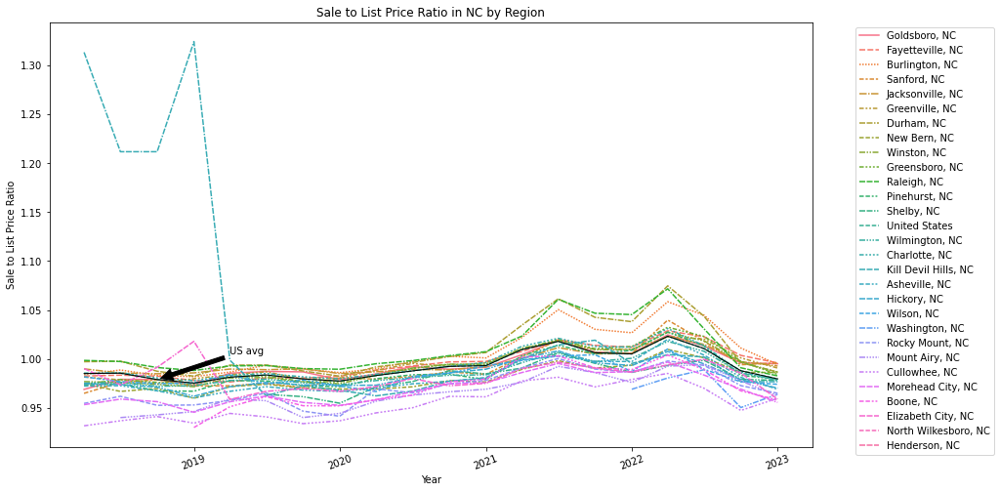

In [29]:
#Plotting Sale to List price ratio
mean_sale_to_list_nc_qtr = mean_sale_to_list_nc_subset.resample("QS-JAN").mean()
fig, ax = plt.subplots(figsize= (14,8))
plt.title("Sale to List Price Ratio in NC by Region")
plt.xlabel("Year")
plt.ylabel("Sale to List Price Ratio")
plt.xticks(rotation = 20)
sns.lineplot(data= mean_sale_to_list_nc_qtr)
#overlaying the US data over the NC data
x1 = mean_sale_to_list_nc_qtr.index
y1= mean_sale_to_list_nc_qtr['United States']
ax.plot(x1, y1, linewidth=1, color='black')
ax.annotate('US avg', xy=(x1[2], y1[2]), xytext=(x1[4], y1[15]), arrowprops=dict(facecolor='black', shrink=0.05))
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')

plt.show()

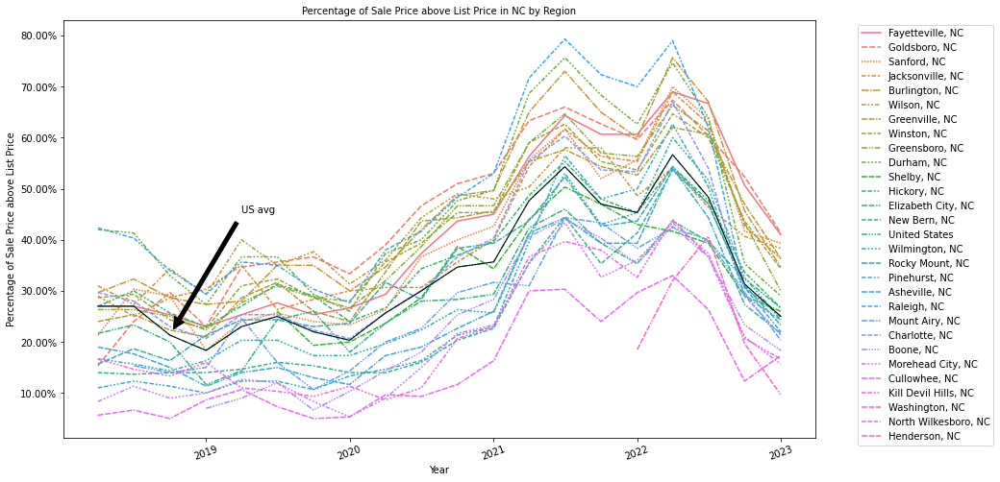

In [30]:
#Plotting Ratio of sales where Sale Price is above the final list price
sold_above_pct_nc_qtr = sold_above_pct_nc_subset.resample("QS-JAN").mean()
fig, ax = plt.subplots(figsize= (14,8))
x1 = sold_above_pct_nc_qtr.index
y1= sold_above_pct_nc_qtr['United States']
ax.yaxis.set_major_formatter('{x:1.2f}%')
plt.title("Percentage of Sale Price above List Price in NC by Region", size=10)
plt.xlabel("Year")
plt.ylabel("Percentage of Sale Price above List Price")
plt.xticks(rotation = 20)
sns.lineplot(data= sold_above_pct_nc_qtr)
ax.plot(x1, y1, linewidth=1, color='black')
ax.annotate('US avg', xy=(x1[2], y1[2]), xytext=(x1[4], y1[15]), arrowprops=dict(facecolor='black', shrink=0.05))
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')

plt.show()

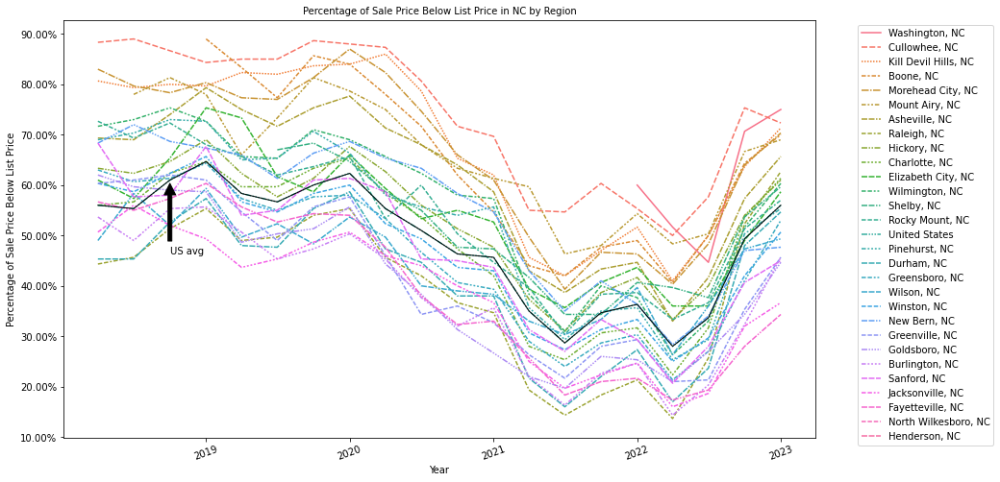

In [31]:
#Plotting Ratio of sales where Sale Price is below the final list price
sold_below_pct_nc_qtr = sold_below_pct_nc_subset.resample("QS-JAN").mean()
fig, ax = plt.subplots(figsize= (14,8))
ax.yaxis.set_major_formatter('{x:1.2f}%')
x1 = sold_below_pct_nc_qtr.index
y1= sold_below_pct_nc_qtr['United States']
plt.title("Percentage of Sale Price Below List Price in NC by Region", size=10)
plt.xlabel("Year")
plt.ylabel("Percentage of Sale Price Below List Price")
plt.xticks(rotation = 20)
sns.lineplot(data= sold_below_pct_nc_qtr)
ax.plot(x1, y1, linewidth=1, color='black')
ax.annotate('US avg', xy=(x1[2], y1[2]), xytext=(x1[2], y1[10]), arrowprops=dict(facecolor='black', shrink=0.05))
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')

plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 💡There was an increase of properties selling above list price in 2021 and the first half of 2022. The sale values have started to decline since mid 2022. And we now see an increase in sale value below list value, which is a btter time for us to invest, as properties are not expensive now as  it was 2 years back.
</div>

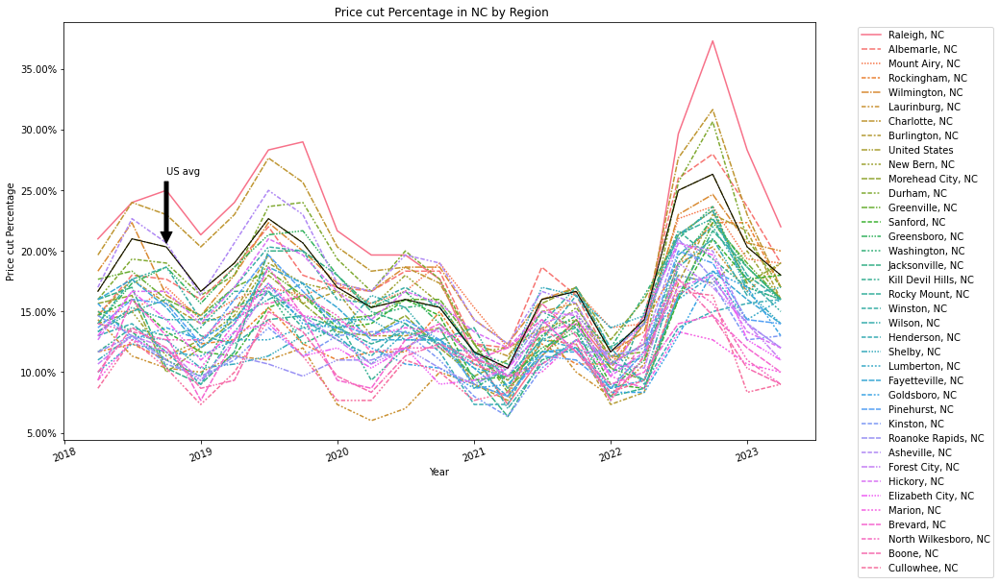

In [32]:
#Price cuts percentage
price_cut_pct_nc_qtr = price_cut_pct_nc_subset.resample("QS-JAN").mean()
fig, ax = plt.subplots(figsize= (14,8))
ax.yaxis.set_major_formatter('{x:1.2f}%')
x1 = price_cut_pct_nc_qtr.index
y1= price_cut_pct_nc_qtr['United States']
plt.title(" Price cut Percentage in NC by Region")
plt.xlabel("Year")
plt.ylabel("Price cut Percentage")
plt.xticks(rotation = 20)
sns.lineplot(data= price_cut_pct_nc_qtr)
ax.plot(x1, y1, linewidth=1, color='black')
ax.annotate('US avg', xy=(x1[2], y1[2]), xytext=(x1[2], y1[18]), arrowprops=dict(facecolor='black', shrink=0.05))
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')

plt.show()

In [33]:
#Calculating the average rent in 2023
zori_nc_year = zori_nc_subset.resample("AS-JAN").mean()
#zori_nc_year.columns
rent_nc_avg_23 = zori_nc_year.mean(axis=1)
print("The average rent in NC in 2023 is: $",rent_nc_avg_23['2023-01-01'])

The average rent in NC in 2023 is: $ 1544.3529894699639


In [34]:
#Average selling price in 2023
nc_median_sale_price_year = median_sale_price_nc_subset.resample("AS-JAN").mean()
nc_avg_sale_price_23= nc_median_sale_price_year.mean(axis=1)
print("The average sale Price in NC in 2023 is: $",nc_avg_sale_price_23['2023-01-01'])

The average sale Price in NC in 2023 is: $ 268952.5555555556


In [35]:
'''
Mortage calculation
In North Carolina, the property average sale price in 2023 is $264352. let's calculate how much we will spend in mortgage
According to Bankrate, in 2023 "the national average 30-year fixed mortgage APR is 6.91%. " 
https://www.bankrate.com/mortgages/mortgage-rates/north-carolina/?mortgageType=Refinance&partnerId=br3&pid=br3&pointsChanged=false&refinanceCashOutAmount=0&refinanceLoanAmount=372000&refinanceLoanTerms=30yr%2C5-1arm%2C5-6arm&refinancePoints=All&refinancePropertyType=SingleFamily&refinancePropertyUse=PrimaryResidence&refinancePropertyValue=620000&searchChanged=false&ttcid&userCreditScore=780&userDebtToIncomeRatio=0&userFha=false&userVeteranStatus=NoMilitaryService&zipCode=27610
'''
#Without any down-payment
loan = Loan(principal=268953, interest=.0691, term=15)
display(loan.summarize)

#With 30% down payment
loan1 = Loan(principal=179302, interest=.0691, term=15)
display(loan1.summarize)

#with a 50% down-payment
loan2 = Loan(principal=134476, interest=.0691, term=15)
display(loan2.summarize)

Original Balance:         $    268,953
Interest Rate:             0.06909999999999999253930127452 %
APY:                              7.13 %
APR:                              6.91 %
Term:                               15 years
Monthly Payment:          $    2403.91

Total principal payments: $ 268,953.00
Total interest payments:  $ 163,751.33
Total payments:           $ 432,704.33
Interest to principal:            60.9 %
Years to pay:                     15.0


None

Original Balance:         $    179,302
Interest Rate:             0.06909999999999999253930127452 %
APY:                              7.13 %
APR:                              6.91 %
Term:                               15 years
Monthly Payment:          $    1602.61

Total principal payments: $ 179,302.00
Total interest payments:  $ 109,167.56
Total payments:           $ 288,469.56
Interest to principal:            60.9 %
Years to pay:                     15.0


None

Original Balance:         $    134,476
Interest Rate:             0.06909999999999999253930127452 %
APY:                              7.13 %
APR:                              6.91 %
Term:                               15 years
Monthly Payment:          $    1201.95

Total principal payments: $ 134,476.00
Total interest payments:  $  81,875.36
Total payments:           $ 216,351.36
Interest to principal:            60.9 %
Years to pay:                     15.0


None

In [36]:
#With a 50% down payment, in 2023
#Average mortgage monthly payment
nc_monthly_mortage = 1201.95

#average rental cost in NC
nc_avg_rent = 1544.35

#potential profits
profit = nc_avg_rent-nc_monthly_mortage
print('Our per property average profit would potentially be: $',profit)

Our per property average profit would potentially be: $ 342.39999999999986


<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 💡From the above calculations, we can see that in order to make profit we will need to make a 50% down payment and take a shorter term mortgage of 15years; so that we don't end up paying a lot of money in interest.
</div>

<a id="14"></a>
# <p style="padding:10px;background-color:#1277e1;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;overflow:hidden;font-weight:500">Tennessee Analysis</p>

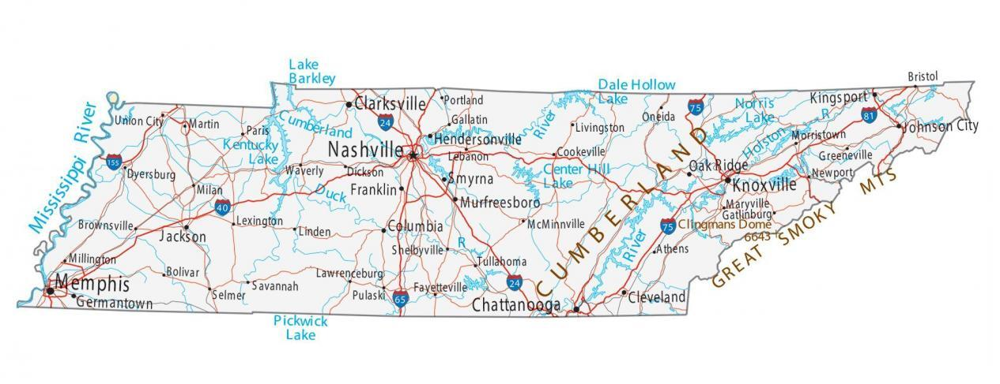

credit: GISGeography

<a id="14"></a>
# <p style="padding:10px;background-color:#FF8200;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;overflow:hidden;font-weight:500">Home Value & Rental Trends</p>

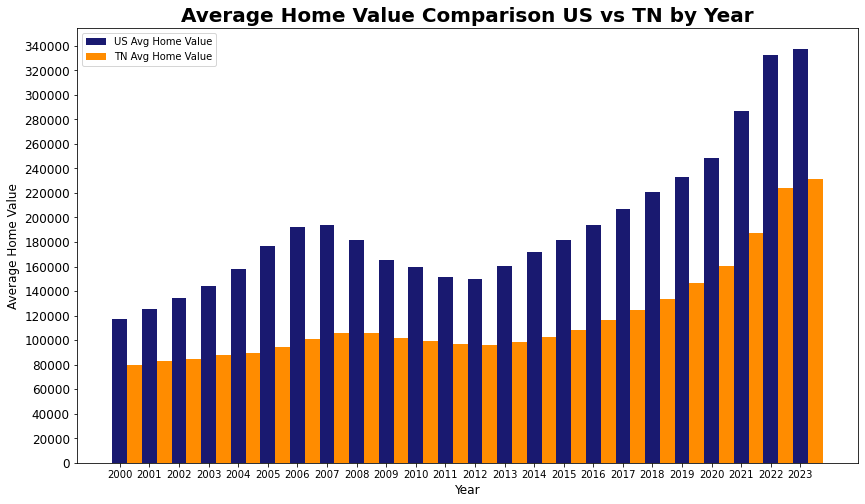

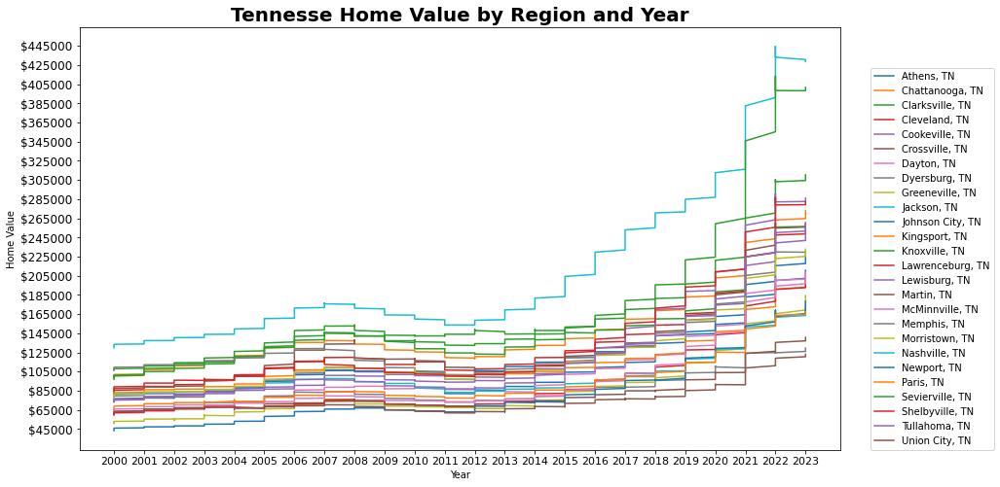

In [37]:
#Set up the figure and axis
fig, ax = plt.subplots(figsize=(14,8))

#Set the width of each bar
bar_width = .5

#US Mean Home Values
ax.bar(zhvi_US['time_period'].dt.year, zhvi_US.groupby(zhvi_US.time_period.dt.year)['home_value'].transform('mean'), width=bar_width, color='midnightblue', label='US Avg Home Value')

#TN Mean Home Values
ax.bar(zhvi_tn['time_period'].dt.year + bar_width, zhvi_tn.groupby(zhvi_tn.time_period.dt.year)['home_value'].transform('mean'), width=bar_width, color='darkorange', label='TN Avg Home Value')

#Set the title and axis labels
ax.set_title('Average Home Value Comparison US vs TN by Year',fontsize=20,fontweight='bold')
ax.set_xlabel('Year',fontsize=12)
ax.set_ylabel('Average Home Value',fontsize=12)
plt.xticks(np.arange(2000,2024,1),fontsize=10)
plt.yticks(np.arange(0,360000,20000),fontsize=12)

plt.legend()

#grouping TN melted data by RegionName and creating a line chart for each group
groups = zhvi_tn.groupby('RegionName')
fig, ax3 = plt.subplots(figsize=(14,8))
for name, group in groups:
    ax3.plot(group['time_period'].dt.year, group['home_value'], label=name)

# set the title and axis labels for TN
plt.title('Tennesse Home Value by Region and Year',fontsize=20,fontweight='bold')
plt.xlabel('Year')
plt.ylabel('Home Value')
plt.xticks(np.arange(2000,2024,1),fontsize=11)
plt.yticks(np.arange(45000,450000,20000),fontsize=12)
ax3.yaxis.set_major_formatter('${x:1.0f}')

# add a legend to the plot and setting its location outside of the graph for TN
plt.legend(loc=(1.04, 0))

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 The market trends in Tennessee show a growth pattern prior to 'The Great Recession' in 2008 where home values began to fall and then a rebound towards growth starting in 2012 with a rapid acceleration in 2020. If you compare Tennessee against the US you'll also notice home values in Tennessee are mirroring the overall market trend for the country, but are substanially lower in average cost where Tennessee sits at 230000 dollars in comparison to the US average cost of 340000 dollars in 2023. 
</div>

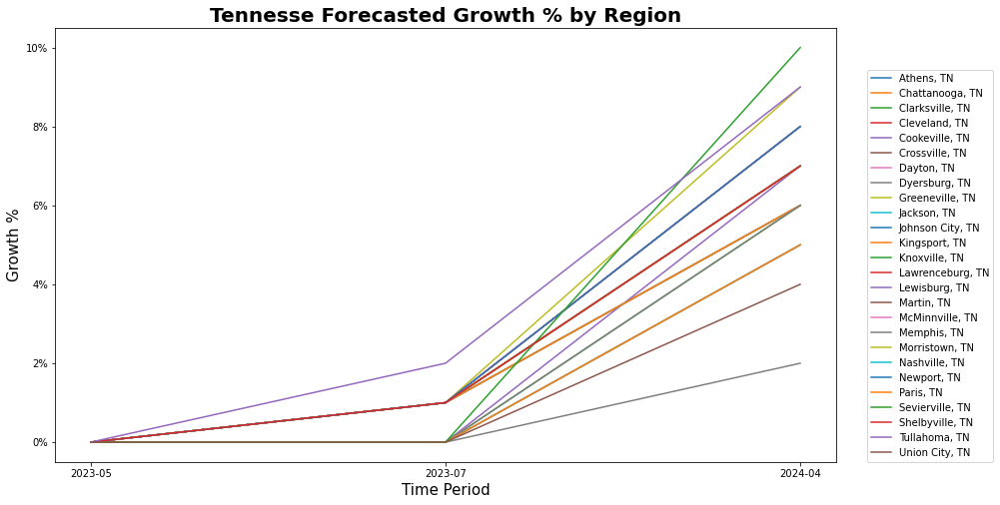

In [38]:
# grouping melted data by RegionName and creating a line chart for each group
groups = zhvf_tn.groupby('RegionName')
fig, ax = plt.subplots(figsize=(14,8))
for name, group in groups:
    ax.plot(group['month_year'], group['forecast'], label=name)

# set the title and axis labels
plt.title('Tennesse Forecasted Growth % by Region',fontsize=20,fontweight='bold')
plt.xlabel('Time Period',fontsize=15)
plt.ylabel('Growth %',fontsize=15)
ax.yaxis.set_major_formatter('{x:1.0f}%')

# add a legend to the plot and setting its location outside of the graph
plt.legend(loc=(1.04, 0))

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 The growth forecasts for Tennessee show minimal downside when it comes to growth in home values with a bulk trending north of 1% with a handful of outliers with projections in Q1 2024 between 3-10%. In comparison to the US market as a whole where projections are projected to be 1% there is substanial upside to moving into the Tennessee market.
</div>

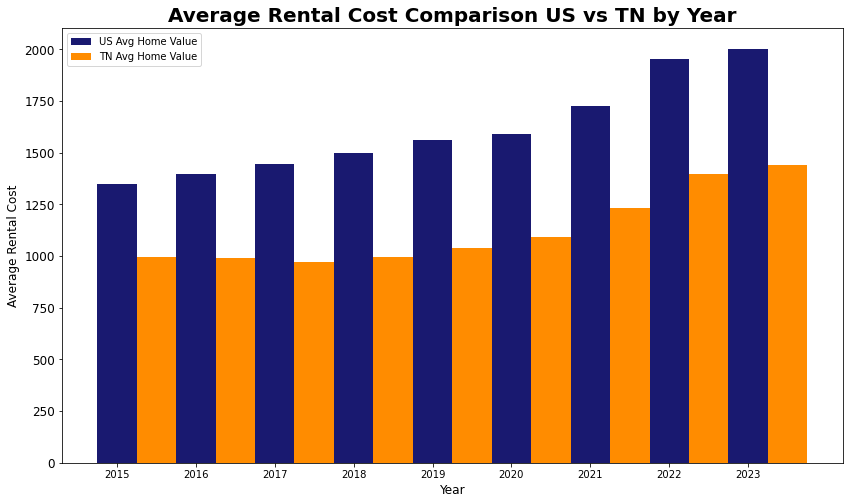

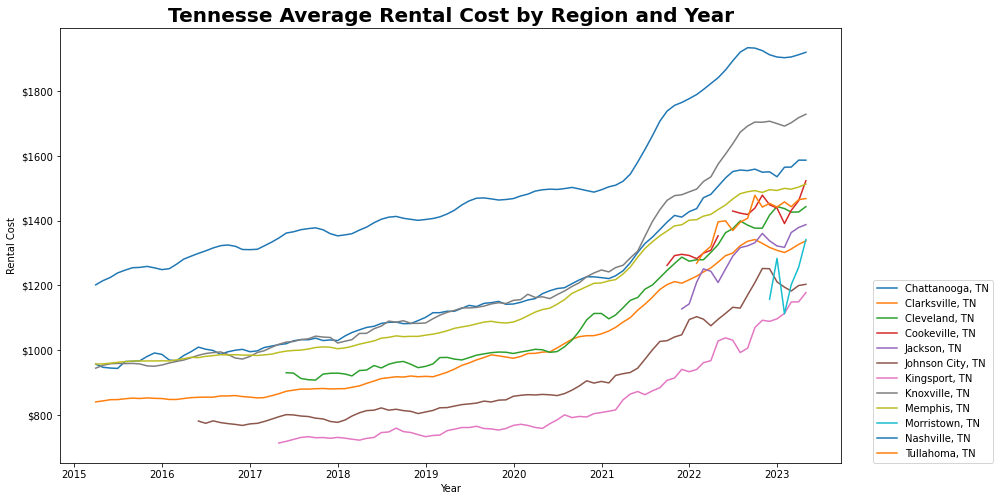

In [39]:
#Set up the figure and axis
fig, ax = plt.subplots(figsize=(14,8))

#Set the width of each bar
bar_width = .5

#US Mean Home Values
ax.bar(zori_US['time_period'].dt.year, zori_US.groupby(zori_US.time_period.dt.year)['rental_cost'].transform('mean'), width=bar_width, color='midnightblue', label='US Avg Home Value')

#TN Mean Home Values
ax.bar(zori_tn['time_period'].dt.year + bar_width, zori_tn.groupby(zori_tn.time_period.dt.year)['rental_cost'].transform('mean'), width=bar_width, color='darkorange', label='TN Avg Home Value')

#Set the title and axis labels
ax.set_title('Average Rental Cost Comparison US vs TN by Year',fontsize=20,fontweight='bold')
ax.set_xlabel('Year',fontsize=12)
ax.set_ylabel('Average Rental Cost',fontsize=12)
plt.xticks(np.arange(2015,2024,1),fontsize=10)
plt.yticks(np.arange(0,2200,250),fontsize=12)

plt.legend()

# grouping melted data by RegionName and creating a line chart for each group
groups = zori_tn.groupby('RegionName')
fig, ax2 = plt.subplots(figsize=(14,8))
for name, group in groups:
    ax2.plot(group['time_period'], group['rental_cost'], label=name)

# set the title and axis labels
plt.title('Tennesse Average Rental Cost by Region and Year',fontsize=20,fontweight='bold')
plt.xlabel('Year')
plt.ylabel('Rental Cost')
ax2.yaxis.set_major_formatter('${x:1.0f}')

# add a legend to the plot and setting its location outside of the graph
plt.legend(loc=(1.04, 0))

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 The Tennessee markets in comparison the United States as a whole are well underneath the average rental cost which highlights its ability to be a potential landing spot for renters in major cities in Tennessee as people grapple with home/rental afforadability.Zillow's ZORI index only tracks rental values for 12 of the 26 markets within Tenneessee from 2015-2023 showcasing a solid staircase like growth pattern with only a handful of markets dipping in 2023 in regards to rental costs.  
</div>

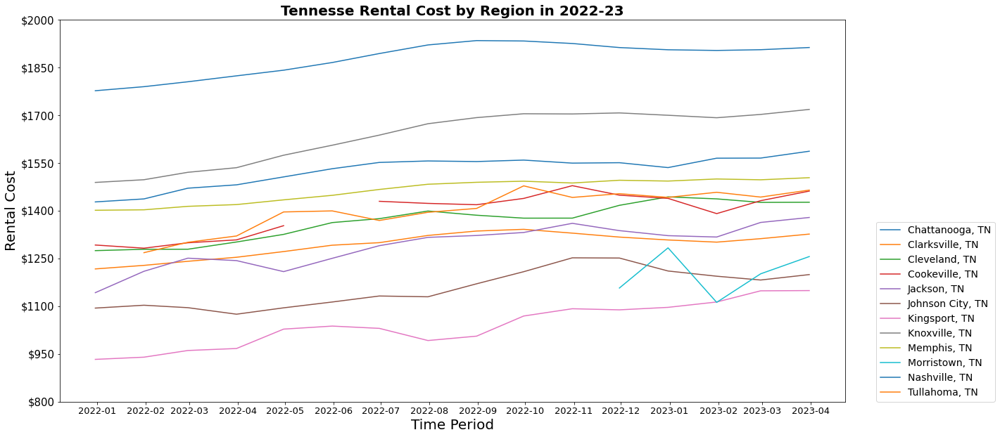

In [40]:
#creating a smaller timeframe to analyze trends more closely
zori_tn_2022_23 = zori_tn.loc[zori_tn['time_period'].between("2021-12-01","2023-03-31")]

# grouping melted data by RegionName and creating a line chart for each group
groups = zori_tn_2022_23.groupby('RegionName')
fig, ax = plt.subplots(figsize=(20,10))
for name, group in groups:
    ax.plot(group['time_period'], group['rental_cost'], label=name)

# set the title and axis labels
plt.title('Tennesse Rental Cost by Region in 2022-23',fontsize=20,fontweight='bold')
plt.xlabel('Time Period',fontsize=20)
plt.ylabel('Rental Cost',fontsize=20)
plt.xticks(fontsize=13)
plt.yticks(np.arange(800,2105,150),fontsize=15)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
ax.yaxis.set_major_formatter('${x:1.0f}')


# add a legend to the plot and setting its location outside of the graph
plt.legend(loc=(1.04, 0),fontsize=14)

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 If we take Zillow's ZORI index and refine its granularity to market trends in 2022-23 we are able to see rental costs are not fluctuating too rapidly in most markets, but rent in the bands of $950-1400 are steadily rising.
</div>

<a id="14"></a>
# <p style="padding:10px;background-color:#FF8200;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;overflow:hidden;font-weight:500">Inventory Trends</p>

In [41]:
# creating a smaller time frame to analyze most recent inventory fluctuation
inventory_tn_2022_23 = inventory_tn.loc[inventory_tn["time_period"].between("2021-12-01", "2023-3-31")]
threshold = 1000
inventory_tn_under1k = inventory_tn_2022_23.loc[inventory_tn_2022_23['inventory'] < threshold]
inventory_tn_above1k = inventory_tn_2022_23.loc[inventory_tn_2022_23['inventory'] > threshold]

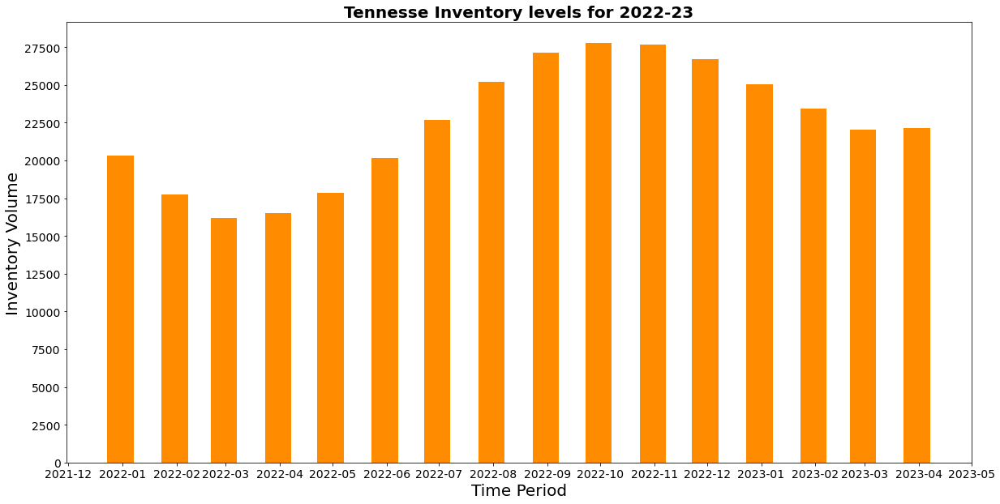

In [42]:
# grouping melted data by RegionName and creating a line chart for each group
plt.figure(figsize= (20,10))
group = plt.bar(inventory_tn_2022_23['time_period'],inventory_tn_2022_23.groupby(inventory_tn_2022_23.time_period)['inventory'].transform('sum'),width = 15,color='darkorange')

# set the title and axis labels
plt.title('Tennesse Inventory levels for 2022-23',fontsize=20,fontweight='bold')
plt.xlabel('Time Period',fontsize=20)
plt.ylabel('Inventory Volume',fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(np.arange(0,30000,2500),fontsize=14)
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))

# show the plot
plt.show()

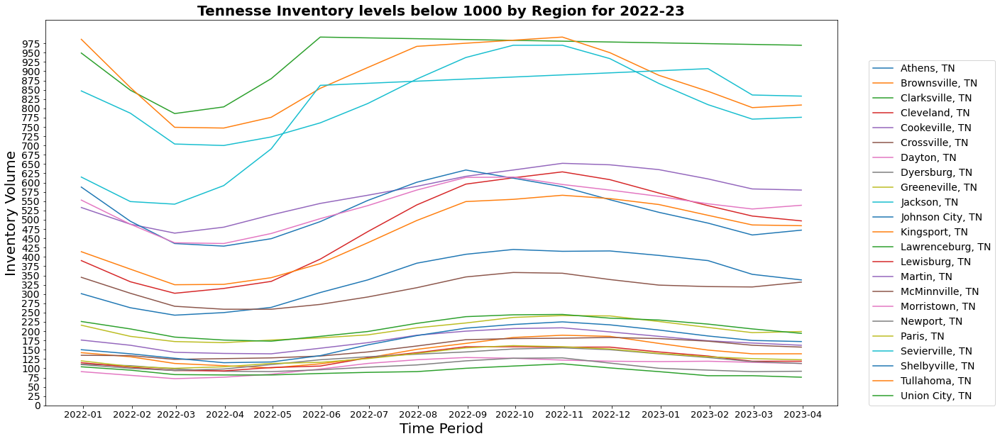

In [43]:
# grouping melted data by RegionName and creating a line chart for each group
groups = inventory_tn_under1k.groupby('RegionName')
fig, ax = plt.subplots(figsize=(20,10))
for name, group in groups:
    ax.plot(group['time_period'], group['inventory'], label=name)

# set the title and axis labels
plt.title('Tennesse Inventory levels below 1000 by Region for 2022-23',fontsize=20,fontweight='bold')
plt.xlabel('Time Period',fontsize=20)
plt.ylabel('Inventory Volume',fontsize=20)
plt.xticks(fontsize=13)
plt.yticks(np.arange(0,1000,25),fontsize=14)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))

# add a legend to the plot and setting its location outside of the graph
plt.legend(loc=(1.04, 0),fontsize=14)

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 Inventory for region's that are below 1000 units available are relatively stagnant to decreasing since October 2022, this is more than likely a by-product of high interest rates and inflation causing people to stay in their properties if they locked in favorable interest rates in 2020-2021.
</div>

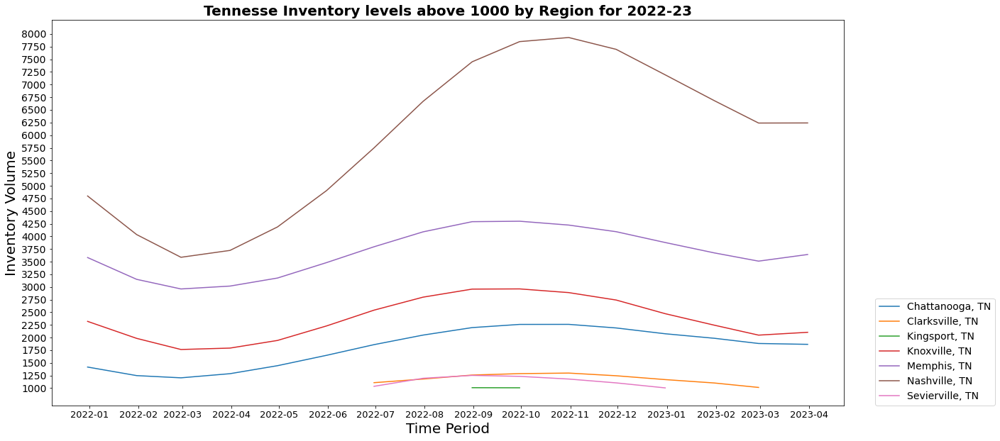

In [44]:
# grouping melted data by RegionName and creating a line chart for each group
groups = inventory_tn_above1k.groupby('RegionName')
fig, ax = plt.subplots(figsize=(20,10))
for name, group in groups:
    ax.plot(group['time_period'], group['inventory'], label=name)

# set the title and axis labels
plt.title('Tennesse Inventory levels above 1000 by Region for 2022-23',fontsize=20,fontweight='bold')
plt.xlabel('Time Period', fontsize=20)
plt.ylabel('Inventory Volume',fontsize=20)
plt.xticks(fontsize=13)
plt.yticks(np.arange(1000,8250,250),fontsize=14)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))

# add a legend to the plot and setting its location outside of the graph
plt.legend(loc=(1.04, 0),fontsize=14)

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 Similarly regions with inventory levels greater than 1000 units available there has been a downward sloping trajectory in available inventory since October 2022. 
</div>

<a id="14"></a>
# <p style="padding:10px;background-color:#FF8200;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;overflow:hidden;font-weight:500">Sales Activity Trends</p>

In [45]:
# creating a smaller time frame to analyze sale history fluctuation
sales_nowcast_tn_2022_23 = sales_nowcast_tn.loc[sales_nowcast_tn["time_period"].between("2021-12-01", "2023-03-31")]

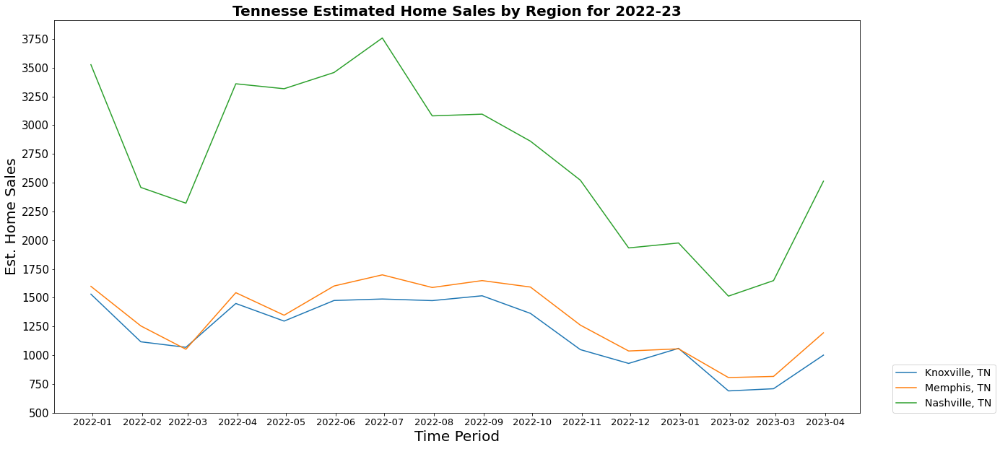

In [46]:
# grouping melted data by RegionName and creating a line chart for each group
groups = sales_nowcast_tn_2022_23.groupby('RegionName')
fig, ax = plt.subplots(figsize=(20,10))
for name, group in groups:
    ax.plot(group['time_period'], group['sales_nowcast'], label=name)

# set the title and axis labels
plt.title('Tennesse Estimated Home Sales by Region for 2022-23',fontsize=20,fontweight='bold')
plt.xlabel('Time Period', fontsize=20)
plt.ylabel('Est. Home Sales',fontsize=20)
plt.xticks(fontsize=13)
plt.yticks(np.arange(500,4000,250),fontsize=15)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))

# add a legend to the plot and setting its location outside of the graph
plt.legend(loc=(1.04, 0),fontsize=14)

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 Zillow's Sale Count Nowcast provides estimated home sales, but only encompasses three of the major metros of Tennessee which can be utilized as a barometer for the Tennessee market as a whole. Home sales started slipping in the Summer 2022 due to the uncertainty of recession and the federal reserve attempting to tame red hot inflation by increasing its interest rates; however, 2023 has show signs of a rebound across available Tennessee markets where buyers are out in force heading into the Spring 2023 buying season. 
</div>

In [47]:
# creating a smaller time frame to analyze days to pending fluctuation
mean_days_to_pending_tn_2022_23 = mean_days_to_pending_tn.loc[mean_days_to_pending_tn["time_period"].between("2021-12-01", "2023-03-31")]

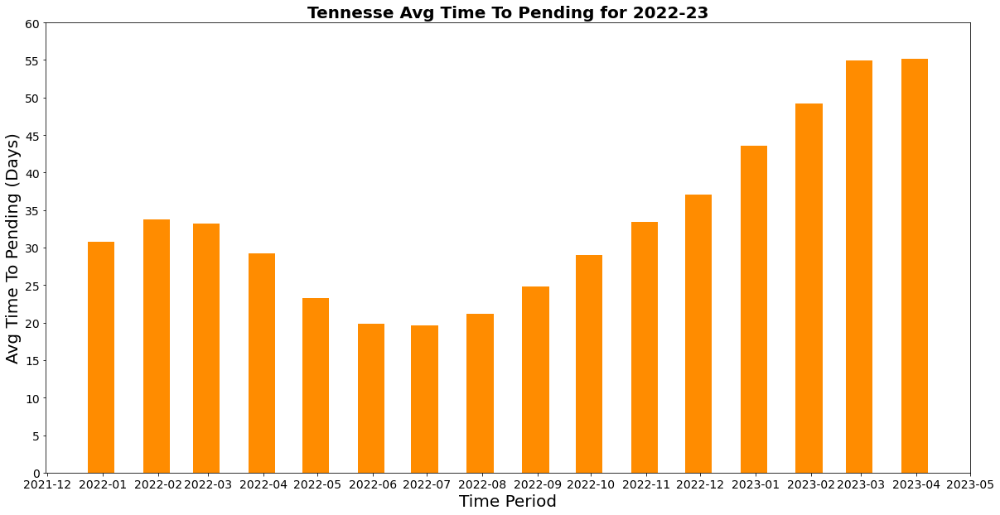

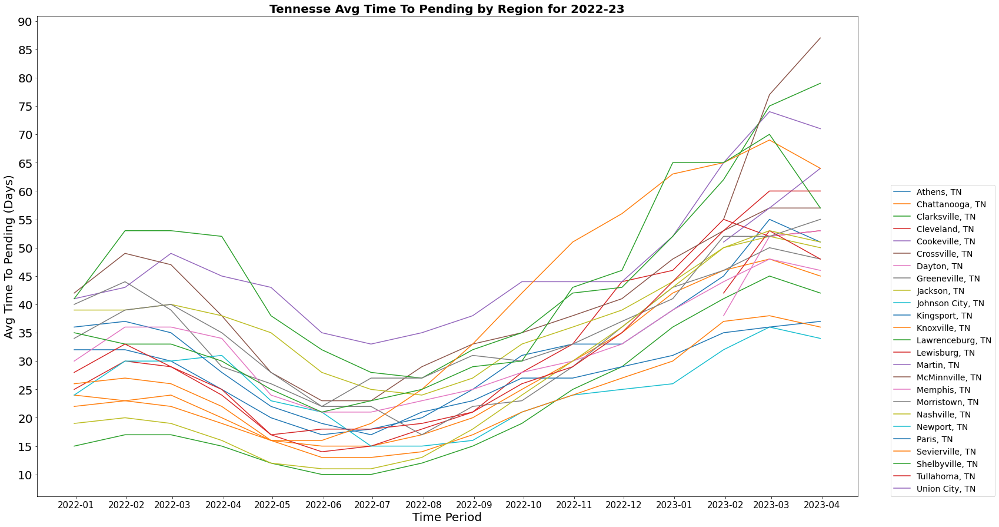

In [48]:
# grouping melted data by RegionName and creating a line chart for each group
plt.figure(figsize= (20,10))
group = plt.bar(mean_days_to_pending_tn_2022_23['time_period'],mean_days_to_pending_tn_2022_23.groupby(mean_days_to_pending_tn_2022_23.time_period)['mean_days_to_pending'].transform('mean'),width = 15,color='darkorange')

# set the title and axis labels
plt.title('Tennesse Avg Time To Pending for 2022-23',fontsize=20,fontweight='bold')
plt.xlabel('Time Period',fontsize=20)
plt.ylabel('Avg Time To Pending (Days)',fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(np.arange(0,65,5),fontsize=14)
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))

# grouping melted data by RegionName and creating a line chart for each group
groups = mean_days_to_pending_tn_2022_23.groupby('RegionName')
fig, ax = plt.subplots(figsize=(25,15))
for name, group in groups:
    ax.plot(group['time_period'], group['mean_days_to_pending'], label=name)

# set the title and axis labels
plt.title('Tennesse Avg Time To Pending by Region for 2022-23',fontsize=20,fontweight='bold')
plt.xlabel('Time Period', fontsize=20)
plt.ylabel('Avg Time To Pending (Days)',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(np.arange(10,95,5),fontsize=20)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))

# add a legend to the plot and setting its location outside of the graph
plt.legend(loc=(1.04, 0),fontsize=14)

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 The average time for a home to move to pending status after listing has been rapidly climbing since the summer of 2022 with the pending days band moving from 10-40 days to Winter 2023 seeing times reach 30-90 days depending on the market. 
</div>

In [49]:
# creating a smaller time frame to analyze days to close fluctuation
mean_days_to_close_tn_2022_23 = mean_days_to_close_tn.loc[mean_days_to_close_tn["time_period"].between("2021-12-01", "2023-04-30")]

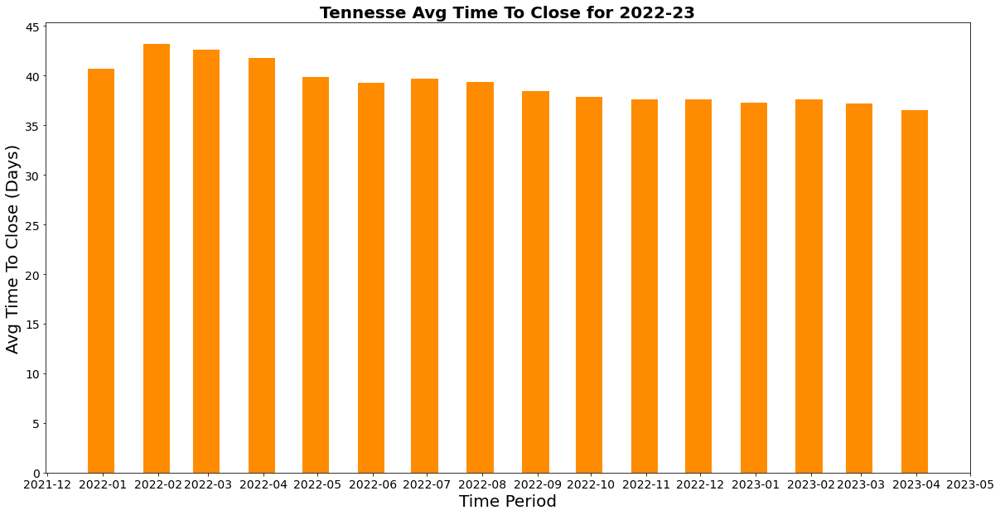

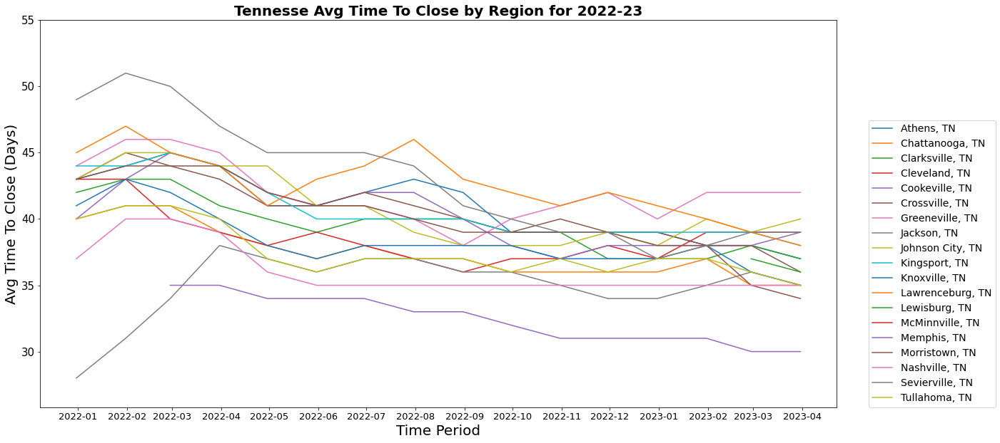

In [50]:
# grouping melted data by RegionName and creating a line chart for each group
plt.figure(figsize= (20,10))
group = plt.bar(mean_days_to_close_tn_2022_23['time_period'],mean_days_to_close_tn_2022_23.groupby(mean_days_to_close_tn_2022_23.time_period)['mean_days_to_close'].transform('mean'),width = 15,color='darkorange')

# set the title and axis labels
plt.title('Tennesse Avg Time To Close for 2022-23',fontsize=20,fontweight='bold')
plt.xlabel('Time Period',fontsize=20)
plt.ylabel('Avg Time To Close (Days)',fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(np.arange(0,50,5),fontsize=14)
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))

# grouping melted data by RegionName and creating a line chart for each group
groups = mean_days_to_close_tn_2022_23.groupby('RegionName')
fig, ax = plt.subplots(figsize=(20,10))
for name, group in groups:
    ax.plot(group['time_period'], group['mean_days_to_close'], label=name)

# set the title and axis labels
plt.title('Tennesse Avg Time To Close by Region for 2022-23',fontsize=20,fontweight='bold')
plt.xlabel('Time Period', fontsize=20)
plt.ylabel('Avg Time To Close (Days)',fontsize=20)
plt.xticks(fontsize=13)
plt.yticks(np.arange(30,57,5),fontsize=15)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))

# add a legend to the plot and setting its location outside of the graph
plt.legend(loc=(1.04, 0),fontsize=14)

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 The average time to close on a home in the Tennessee market in the last 16 months has rapidly fell below 45 days with most homes averaging between 35-45 once a contract is in hand
</div>

In [51]:
#Using merge() on multiple columns to create new dataframe to calculate days from list to closed.
tn_pending2close_merged = pd.merge(mean_days_to_pending_tn_2022_23, mean_days_to_close_tn_2022_23, on=['RegionID','SizeRank','RegionName','RegionType','StateName','time_period'])
tn_pending2close_merged['mean_days_to_close'].fillna(0)

tn_pending2close_merged['days_on_market'] = tn_pending2close_merged['mean_days_to_pending'] + tn_pending2close_merged['mean_days_to_close']

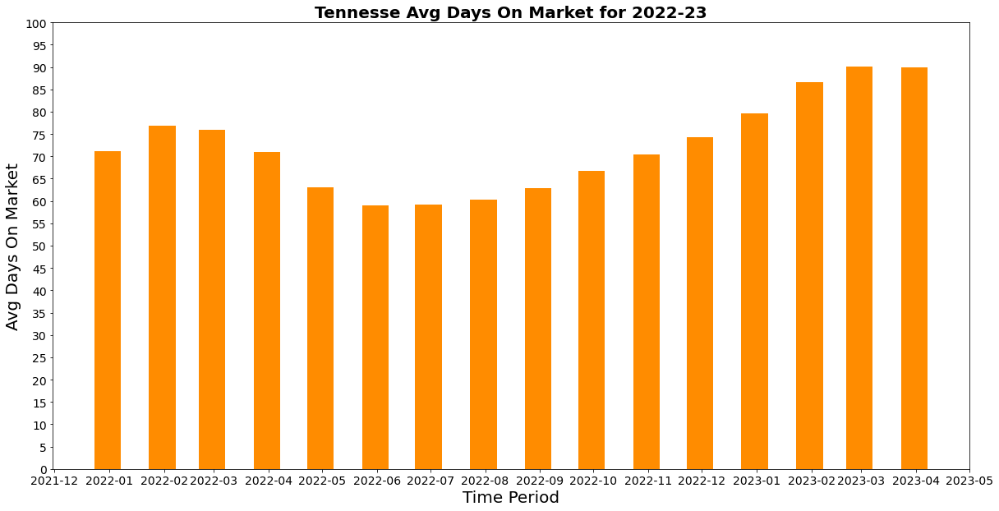

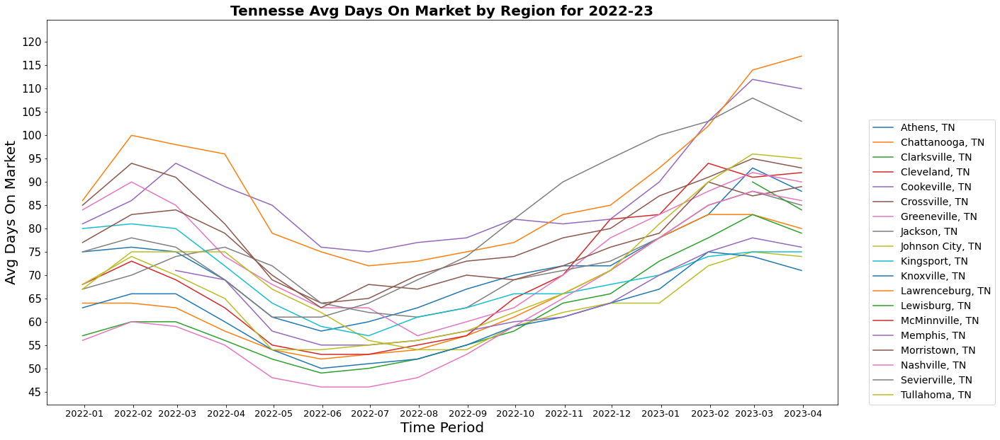

In [52]:
# grouping melted data by RegionName and creating a line chart for each group
plt.figure(figsize= (20,10))
group = plt.bar(tn_pending2close_merged['time_period'],tn_pending2close_merged.groupby(tn_pending2close_merged.time_period)['days_on_market'].transform('mean'),width = 15,color='darkorange')

# set the title and axis labels
plt.title('Tennesse Avg Days On Market for 2022-23',fontsize=20,fontweight='bold')
plt.xlabel('Time Period',fontsize=20)
plt.ylabel('Avg Days On Market',fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(np.arange(0,105,5),fontsize=14)
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))

# grouping melted data by RegionName and creating a line chart for each group
groups = tn_pending2close_merged.groupby('RegionName')
fig, ax = plt.subplots(figsize=(20,10))
for name, group in groups:
    ax.plot(group['time_period'], group['days_on_market'], label=name)

# set the title and axis labels
plt.title('Tennesse Avg Days On Market by Region for 2022-23',fontsize=20,fontweight='bold')
plt.xlabel('Time Period', fontsize=20)
plt.ylabel('Avg Days On Market',fontsize=20)
plt.xticks(fontsize=13)
plt.yticks(np.arange(45,125,5),fontsize=15)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))

# add a legend to the plot and setting its location outside of the graph
plt.legend(loc=(1.04, 0),fontsize=14)

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 If we look at the listing process as a whole from the time a home is listed to closed we see there is a substanial rise in the time it takes to sell a home in Tennessee. Which isn't surprising given the state of the market with home values rising alongside high interest rates from lenders it is causing a longer sales cycle.
</div>

<a id="14"></a>
# <p style="padding:10px;background-color:#FF8200;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;overflow:hidden;font-weight:500">Sales Price Trends</p>

In [53]:
# creating a smaller time frame to analyze price cuts fluctuation
mean_sale_to_list_tn_2022_23 = mean_sale_to_list_tn.loc[mean_sale_to_list_tn["time_period"].between("2021-12-01", "2023-04-30")]

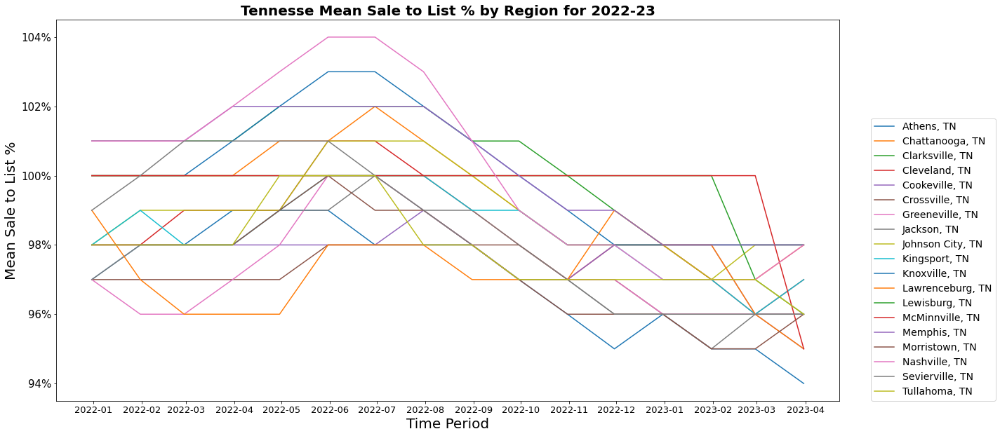

In [54]:
# grouping melted data by RegionName and creating a line chart for each group
groups = mean_sale_to_list_tn_2022_23.groupby('RegionName')
fig, ax = plt.subplots(figsize=(20,10))
for name, group in groups:
    ax.plot(group['time_period'], group['mean_sale2list_ratio'], label=name)

# set the title and axis labels
plt.title('Tennesse Mean Sale to List % by Region for 2022-23',fontsize=20,fontweight='bold')
plt.xlabel('Time Period', fontsize=20)
plt.ylabel('Mean Sale to List %',fontsize=20)
plt.xticks(fontsize=13)
plt.yticks(fontsize=15)
#plt.yticks(np.arange(75000,745000,35000),fontsize=15)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
ax.yaxis.set_major_formatter('{x:1.0f}%')

# add a legend to the plot and setting its location outside of the graph
plt.legend(loc=(1.04, 0),fontsize=14)

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 The mean sale to list ratio is currently trending below 100% which corresponds to many of the homes selling within Tennessee going for less than list price with most markets sitting between 96-99% of list price for completed sales in February 2023.
</div>

In [55]:
# creating a smaller time frame to analyze list price fluctuation
median_list_price_tn_2022_23 = median_list_price_tn.loc[median_list_price_tn["time_period"].between("2021-12-01", "2023-04-30")]
# creating a smaller time frame to analyze sale price fluctuation
median_sale_price_tn_2022_23 = median_sale_price_tn.loc[median_sale_price_tn["time_period"].between("2021-12-01", "2023-04-30")]

#Using merge() on multiple columns to create new dataframe to calculate sale to list $ value.
tn_sale2list_merged = pd.merge(median_list_price_tn_2022_23, median_sale_price_tn_2022_23, on=['RegionID','SizeRank','RegionName','RegionType','StateName','time_period'])
#tn_sale2list_merged['mean_days_to_close'].fillna(0)

tn_sale2list_merged['median_sale2list_$'] = tn_sale2list_merged['mdn_sale_price'] - tn_sale2list_merged['mdn_list_price']

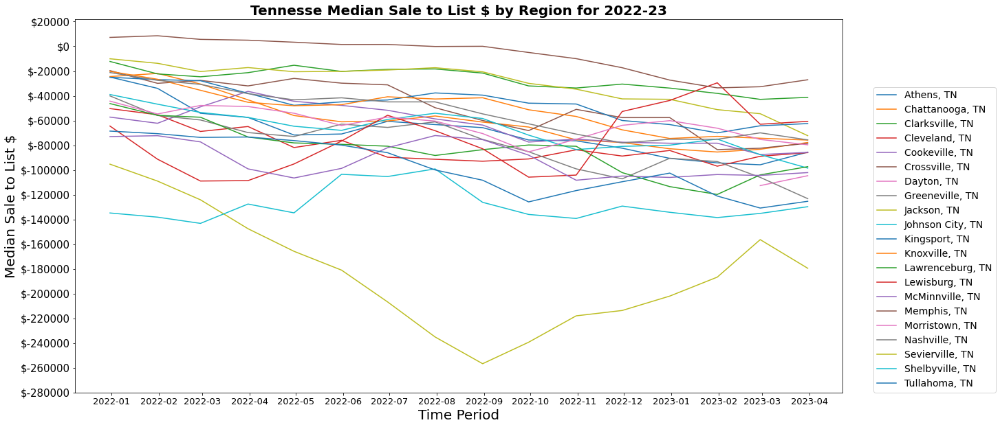

In [56]:
# grouping melted data by RegionName and creating a line chart for each group
groups = tn_sale2list_merged.groupby('RegionName')
fig, ax = plt.subplots(figsize=(20,10))
for name, group in groups:
    ax.plot(group['time_period'], group['median_sale2list_$'], label=name)

# set the title and axis labels
plt.title('Tennesse Median Sale to List $ by Region for 2022-23',fontsize=20,fontweight='bold')
plt.xlabel('Time Period', fontsize=20)
plt.ylabel('Median Sale to List $',fontsize=20)
plt.xticks(fontsize=13)
plt.yticks(np.arange(-280000,40000,20000),fontsize=15)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
ax.yaxis.set_major_formatter('${x:1.0f}')

# add a legend to the plot and setting its location outside of the graph
plt.legend(loc=(1.04, 0),fontsize=14)

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 While looking at mean sale to list ratios in % it provides a relatively mild picture; whereas, if we shift to the median sale to list ratio and flip it to $ it paints a drastically different picture showcasing that many homes in the market from 2022-23 have experienced a reduction in pricing from list price to the final sale price. This correlates well with the average days on market we calculated earlier with sellers being more than willing to lower their pricing, which from an investment perspective paints the picture of acquiring properties at a discount since home value projections showcase strong growth signals over the next 12 months into 2024. 
</div>

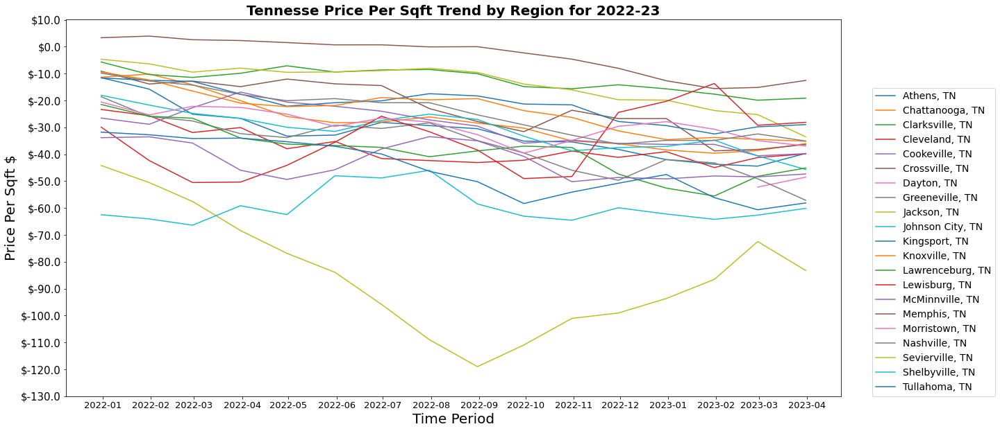

In [57]:
'''I located the average square footage for Tennessee as a whole from the following source:
https://www.fool.com/the-ascent/mortgages/articles/how-big-is-your-home-here-is-the-average-home-size-by-state/

The article was published January 2023 and provided an average square foot per home in TN at 2,157 sqft'''

#Calculating the square footage of sale to list ratio $ using average square footage for TN
tn_sale2list_merged['price_per_sqft_$_trend'] = tn_sale2list_merged['median_sale2list_$'] / 2157

# grouping melted data by RegionName and creating a line chart for each group
groups = tn_sale2list_merged.groupby('RegionName')
fig, ax = plt.subplots(figsize=(20,10))
for name, group in groups:
    ax.plot(group['time_period'], group['price_per_sqft_$_trend'], label=name)

# set the title and axis labels
plt.title('Tennesse Price Per Sqft Trend by Region for 2022-23',fontsize=20,fontweight='bold')
plt.xlabel('Time Period', fontsize=20)
plt.ylabel('Price Per Sqft $',fontsize=20)
plt.xticks(fontsize=13)
plt.yticks(np.arange(-130,15,10),fontsize=15)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
ax.yaxis.set_major_formatter('${x:1.1f}')

# add a legend to the plot and setting its location outside of the graph
plt.legend(loc=(1.04, 0),fontsize=14)

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 Tennnesse Price Per Sqft is trending downward as a whole in the last 15 months which shows a temporal market correction and opportunity to buy lower than previous market highs. 
</div>

In [58]:
# creating a smaller time frame to analyze list price fluctuation
median_list_price_tn_2022_23 = median_list_price_tn.loc[median_list_price_tn["time_period"].between("2021-12-01", "2023-03-31")]

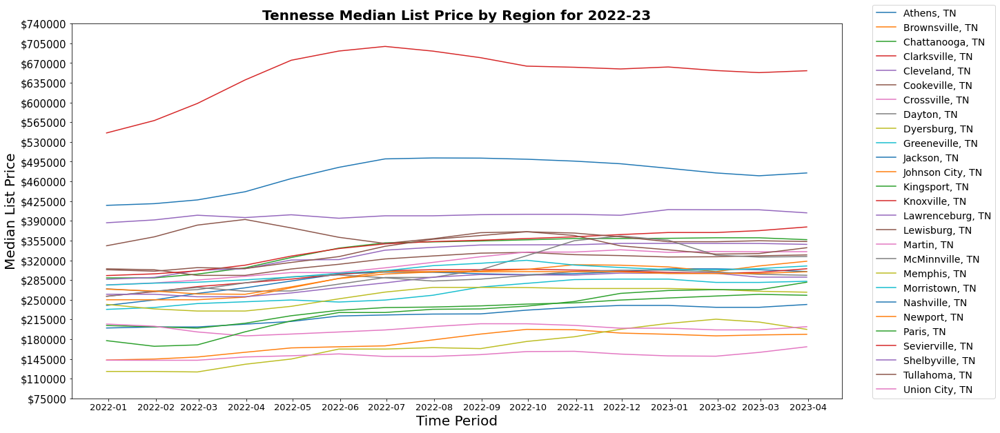

In [59]:
# grouping melted data by RegionName and creating a line chart for each group
groups = median_list_price_tn_2022_23.groupby('RegionName')
fig, ax = plt.subplots(figsize=(20,10))
for name, group in groups:
    ax.plot(group['time_period'], round(group['mdn_list_price']), label=name)

# set the title and axis labels
plt.title('Tennesse Median List Price by Region for 2022-23',fontsize=20,fontweight='bold')
plt.xlabel('Time Period', fontsize=20)
plt.ylabel('Median List Price',fontsize=20)
plt.xticks(fontsize=13)
plt.yticks(np.arange(75000,745000,35000),fontsize=15)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
ax.yaxis.set_major_formatter('${x:1.0f}')

# add a legend to the plot and setting its location outside of the graph
plt.legend(loc=(1.04, 0),fontsize=14)

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 The median house listing price have remained relatively flat with minimal bumps at the start of 2022.
</div>

In [60]:
# creating a smaller time frame to analyze price cuts fluctuation
price_cut_pct_tn_2022_23 = price_cut_pct_tn.loc[price_cut_pct_tn["time_period"].between("2021-12-01", "2023-03-31")]

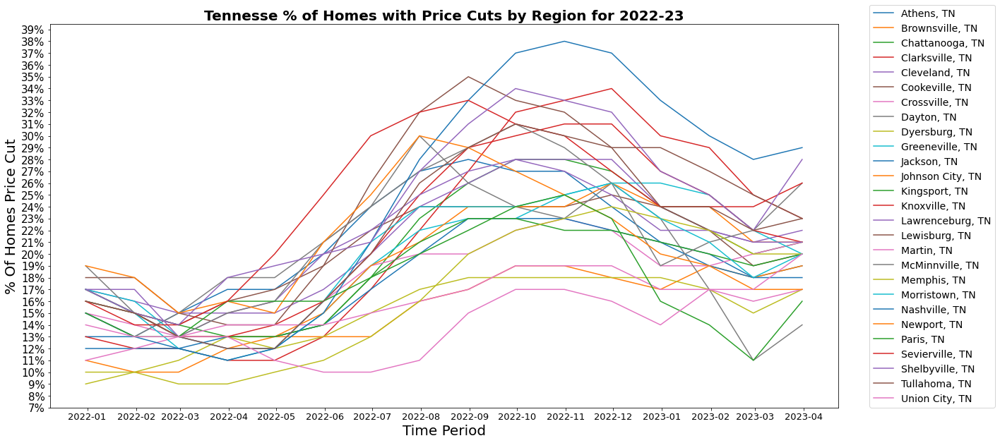

In [61]:
# grouping melted data by RegionName and creating a line chart for each group
groups = price_cut_pct_tn_2022_23.groupby('RegionName')
fig, ax = plt.subplots(figsize=(20,10))
for name, group in groups:
    ax.plot(group['time_period'], round(group['price_cut_pct']), label=name)

# set the title and axis labels
plt.title('Tennesse % of Homes with Price Cuts by Region for 2022-23',fontsize=20,fontweight='bold')
plt.xlabel('Time Period', fontsize=20)
plt.ylabel('% Of Homes Price Cut',fontsize=20)
plt.xticks(fontsize=13)
plt.yticks(np.arange(7,40,1),fontsize=15)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
ax.yaxis.set_major_formatter('{x:1.0f}%')

# add a legend to the plot and setting its location outside of the graph
plt.legend(loc=(1.04, 0),fontsize=14)

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 The percentage of homes with a price cut from their listing price at the beginning of each month rose rapidly through 2022 with a moderate retraction heading into 2023, but price cutting is still happening with region's experiencing at a minimum 10% price cut and a maximum 29% price cut in April 2023. 
</div>

In [62]:
# creating a smaller time frame to analyze sale price fluctuation
median_sale_price_tn_2022_23 = median_sale_price_tn.loc[median_sale_price_tn["time_period"].between("2021-12-01", "2023-04-30")]

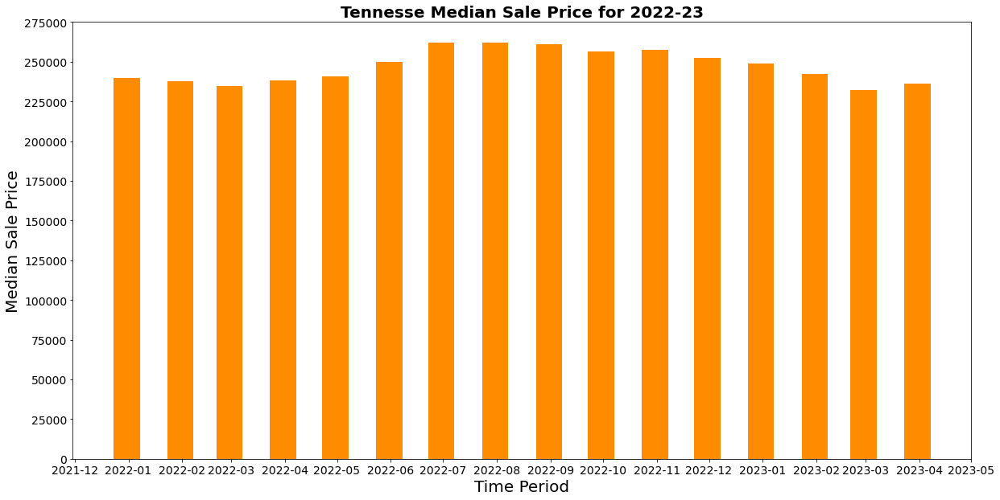

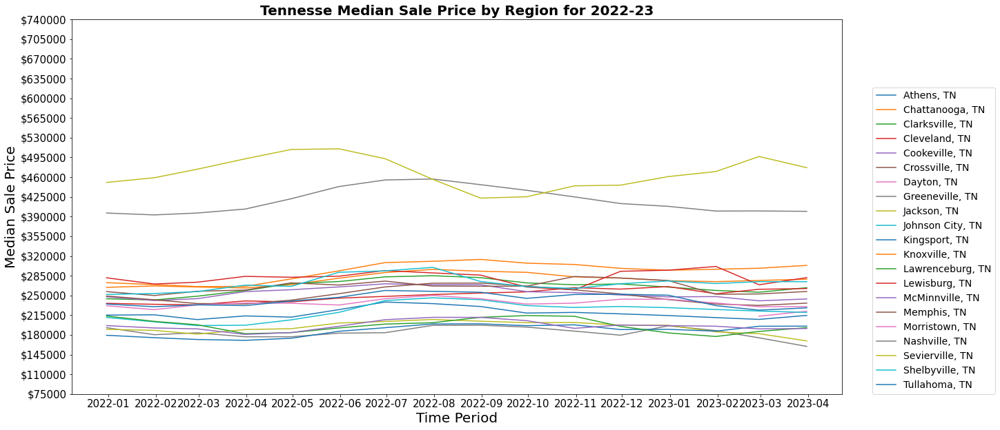

In [63]:
{
    "tags": [
        "hide-input",
    ]
}
# grouping melted data by RegionName and creating a line chart for each group
plt.figure(figsize= (20,10))
group = plt.bar(median_sale_price_tn_2022_23['time_period'],median_sale_price_tn_2022_23.groupby(median_sale_price_tn_2022_23.time_period)['mdn_sale_price'].transform('median'),width = 15,color='darkorange')

# set the title and axis labels
plt.title('Tennesse Median Sale Price for 2022-23',fontsize=20,fontweight='bold')
plt.xlabel('Time Period',fontsize=20)
plt.ylabel('Median Sale Price',fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(np.arange(0,280000,25000),fontsize=14)
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))

# grouping melted data by RegionName and creating a line chart for each group
groups = median_sale_price_tn_2022_23.groupby('RegionName')
fig, ax = plt.subplots(figsize=(20,10))
for name, group in groups:
    ax.plot(group['time_period'], round(group['mdn_sale_price']), label=name)

# set the title and axis labels
plt.title('Tennesse Median Sale Price by Region for 2022-23',fontsize=20,fontweight='bold')
plt.xlabel('Time Period', fontsize=20)
plt.ylabel('Median Sale Price',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(np.arange(75000,745000,35000),fontsize=15)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
ax.yaxis.set_major_formatter('${x:1.0f}')

# add a legend to the plot and setting its location outside of the graph
plt.legend(loc=(1.04, 0),fontsize=14)

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 The median sale price for Tennessee in 2022-23 has stayed relatively flat after home values experienced its rapid growth across the US & Tennnesse. 
</div>

In [64]:
# creating a smaller time frame to analyze sales above listing price
sold_above_pct_tn_2022_23 = sold_above_pct_tn.loc[sold_above_pct_tn["time_period"].between("2021-12-01", "2023-04-30")]

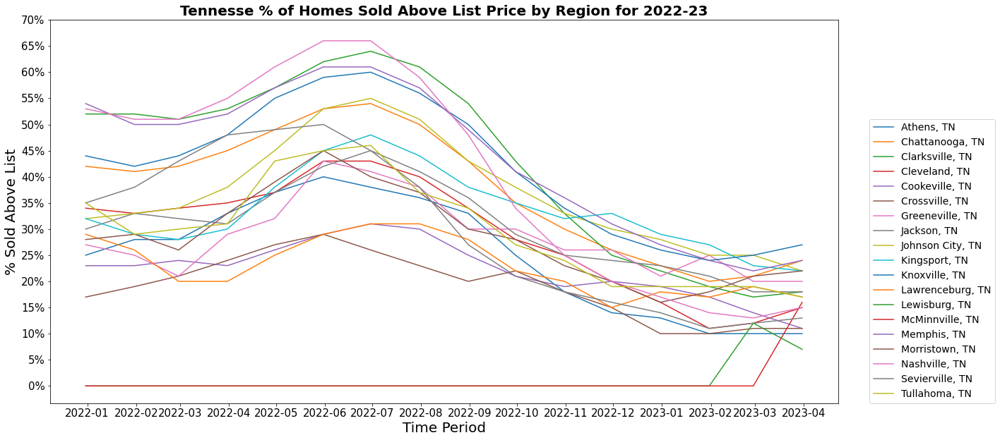

In [65]:
# grouping melted data by RegionName and creating a line chart for each group
groups = sold_above_pct_tn_2022_23.groupby('RegionName')
fig, ax = plt.subplots(figsize=(20,10))
for name, group in groups:
    ax.plot(group['time_period'], round(group['sold_above_pct']), label=name)

# set the title and axis labels
plt.title('Tennesse % of Homes Sold Above List Price by Region for 2022-23',fontsize=20,fontweight='bold')
plt.xlabel('Time Period', fontsize=20)
plt.ylabel('% Sold Above List',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(np.arange(0,75,5),fontsize=15)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
ax.yaxis.set_major_formatter('{x:1.0f}%')

# add a legend to the plot and setting its location outside of the graph
plt.legend(loc=(1.04, 0),fontsize=14)

# show the plot
plt.show()

<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 The market in Tennessee as many markets in the US experienced a rapid ascension in homes sold above list price in early 2022; however, its meteoric ascension is now being met with a more tempered view due to higher interest rates with a less than 30% of homes selling for above list price in April 2023. 
</div>

In [66]:
#Calculating mortgage cost on 15 year mortgage

'''The average median sale price in Tennessee in April 2023 was $225,000, I recommend a 50% down strategy with a 
15 year mortgage to get us to a more reasonable profit margin'''
tn_loan = Loan(principal=112500, interest=.0691, term=15)
tn_loan.summarize

Original Balance:         $    112,500
Interest Rate:             0.06909999999999999253930127452 %
APY:                              7.13 %
APR:                              6.91 %
Term:                               15 years
Monthly Payment:          $    1005.53

Total principal payments: $ 112,500.00
Total interest payments:  $  68,495.33
Total payments:           $ 180,995.33
Interest to principal:            60.9 %
Years to pay:                     15.0


In [67]:
#median mortgage cost from previous cell
tn_mortgagecost_apr23 = 1005.53
#average rental cost in Tennessee
tn_rentalcost_apr23 = 1400.00

#potential profits
profit = tn_rentalcost_apr23 - tn_mortgagecost_apr23

print('Our per property profit would potentially be: $',profit)

Our per property profit would potentially be: $ 394.47


<div style="color:black;
           display:fill;
           border-radius:0px;
           background-color:#97999b;
           font-size:110%;
           font-family:newtimeroman;
           letter-spacing:0.5px">
<p style="padding: 10px;
           color:#000000;"> 🔍 📊 I recommend a 15 year 50% down per property mortgage strategy as this allows for quicker resolution to loans as well as less interest paid to the lenders in the end. In the short term profits are not fully diminished as we can look at collecting decent profits per rental property of 394.47 dollars each month.
</div>

<a id="14"></a>
# <p style="padding:10px;background-color:#1277e1;margin:0;color:#ffffff;font-family:newtimeroman;font-size:100%;text-align:center;overflow:hidden;font-weight:500">Overall Analysis Results</p>

<h1>Summary</h1>


<h4>Cleaning/Munging of DataFrame</h4>

At first we were thrilled with the sheer amount of data at our disposal from Zillow for this analysis; however, it was not in perfect condition for us to begin analysis right away; therefore, it required some munging prior to digging into the exploratory data analysis. We first loaded all the data it in a centralized location utilizing streamlined naming conventions to avoid re-work later down the road. Additionally, due to the nature of the data being time series, we had to adjust the setup where there was a column for each time period utilizng different methodoliges based on each of our analysts. Some used transpose functions while others utilized melt functions available in the Pandas package for Python. Additionally, we wanted to look at data through different lenses such as historical vs current trends within the selected markets to provide proper analysis. 

<h4>How Analysis Is Provided</h4>

As you work through the responses below, please note we will answer the following key questions for each of the selected markets.

1.	Market trends
2.	Sale, Inventory, list to sale ratio price going up or down?
3.	Sqft price for list to sale ratio going up or down?
5.	How long some of the houses are on the market before they rent or sell?
6.	How much average profit I could expect from my investments in terms of rent after paying mortgage.
7.	Should you wait to invest the selected region and states?

<h1>Rental Market Narrow Down (Analyst: Jihun Moon)</h1>

What part of the country to invest for a maximum gain? (Rent)

 

<h4><font color=blue> 1. Rental cost to Home value(RH) Rate</font></h4>
    The most recent rental cost to home value(RH) rate shows that Mississippi has the highest RH rate over the states. However, the state level approach may cover too broad range of real estate situation, so moved on to the region(city) level approach. Small cities like Glenwood Springs, CO, and Vineland, NJ were the leading cities in the RH rate graph. Approximately, top 200 cities were greater than the US mean. Those 200 citie were passed on to the next step.

<h4><font color=blue> 2. Home Value Forecast</font></h4>
    Among the 200 top RH cities, analyze the home value forecasting of 2023-2024. Including Murray, KY as an outstanding leading city and about 100 cities were above the US mean. Passing on those 100 cities.

<h4><font color=blue>3. Inventory (New listing to Inventory, NI Rate)</font></h4>
    Since the cities, from the previous analysis, were mostly are small cities, the inventory numbers and the new listing counts were smaller than the US mean except for a couple of big cities on the top. However, to analyze the liveliness of the market calculated the new listing to inventory(NI) rate in each cities. 45 cities were greater than the US mean of NI rate. The top 3 NI rate states were Georgia and North Carolina: 7 cities, and Indiana: 6 cities.

<h4><font color=blue>4. RH(Rental cost to Home value) Rate Trend</font></h4>
    The 45 top NI cities show that pretty much stable RH trend from 2021-01 - 2023-04 except for a couple of fluctuations and slightly upwarding in a couple of cities. So, the most recent home values and the rental cost are acceptable to calculate the expected profit.

<h4><font color=blue>5.    Expected Profit</font></h4>
    Spreading the risk is one of the basic investment strategy. Mortgage might be one of the tools to strategically spread the investment and the risk. However, if you plan to pay 0% down payment, it is hard to expect the reasonable ourcome. 30% down payment seems fine to spread the investment and to expect the acceptable outcome. Take top 3 and calculate the expected monthly profit out of 7.5m dollars of total investment. The result was approximately $23k.

 

<h4><font color=blue>6. Summary</font></h4>
    After analyzing the rental cost to house value rate, using the 2023-24 forecasting data, taking into consideration of the new listing rate, applying 30% down payment to spread the risk, and selecting three specific cities, the expected monthly profit was estimated to be approximately $23k, before tax. However, upon further examination, the outcome was found to be less significant than anticipated, which could potentially be attributed to the conservative nature of the analysis.

It is important to note that while the estimated monthly profit may not have met initial expectations, the analysis provided valuable insight into the current and projected state of the rental market. The use of multiple data points provides a comprehensive understanding of the trends and patterns within the market.

 

Future analyses can be refined to include additional factors such as property maintenance costs, potential rental income fluctuations, and market volatility to provide a more accurate and detailed assessment. As always, it is crucial to approach any investment opportunity with caution and thorough analysis to minimize risks and maximize potential returns.

<h1>North Carolina (Analyst: Yvette Iradukunda)</h1>

<h4><font color=blue> 1. 📊 Market trends</font></h4>
    Except for 1 region in NC, the rest of them are predicted to have an increase in home value by 04/30/2024.The high majority of them are expected to have an increase greater that the average country increase. There are 6 cities specifically which are forecasted to have >4% increase. From the rental data, we have seen that all the rentals in NC are cheaper that the US average. According to an article by We are Drew titled:The future of work: 8 post-pandemic work trends, " 74% of companies plan to permanently incorporate remote work.". With this in consideration, NC Carolina could be a good market for rental attracting remote workers. https://blog.wearedrew.co/en/the-future-of-work-8-post-pandemic-work-trends

<h4><font color=blue> 2. 📊 Sale, Inventory, list to sale ratio price going up or down?</font> </h4>
    Before 2021, the sale to list ratio was below 1, which means that properties were being sold at a price lower than the list price. However, between 2021 and mid 2022, there was a significant increase in sale price of properties in NC, they were making less than 18% price cuts, where in previous years they were making between 10% and 30% cuts. The good news for us, the selling price has started to decline starting mid 2022, which makes it a good opportunity to buy properties while prices are still low.

<h4><font color=blue>3. 📊 Sqft price for list to sale ratio going up or down?</font></h4>
    Without considering the one outlier region(Kill Devil Hills), the top 12 region with a high sqft price have been increasing in value from between \\$80-\\$110 in 2008 to \\$130-\\$180 in 2022. This is a good sign that homes are increasing in value, in case we decide to sell down the road.

<h4><font color=blue>4. 📊 How long some of the houses are on the market before they rent or sell?</font><h/4>
    In 2023, on average it takes between 20 and 80 days to change to pending status and between 33 and 45 to change from pending to close. In each case, the majority of the regions in NC have a change period less that the US average, which is showing us how fast we can sell the properties if we decide to sell compared to other parts of the US.

<h4><font color=blue>5.    📊 How much average profit I could expect from my investments in terms of rent after paying mortgage.</font></h4>
   One of the good things about NC is that the properties are not very expensive compared to the US average. The top 10 regions are selling between \$300,000 and \$450,000, with the overall average sale price \$268,953, which would allow us to buy multiple properties at low cost. In order to make maximum profit, we would recommend making a 50% down payment and take a 15 years mortgage. WIth this, we should be able to collect  on average \$342.4 of profit per property after paying the mortage.

 

<h4><font color=blue>6. 📊 Should you wait to invest the selected region and states?</font></h4>
    My recommendation is to not wait and buy now. As we have seen in the above analysis, there are projections of the home value to increase in NC by 4% and above in 7 regions and the selling price per sqft has been increasing with time. However, starting mid 2022 the selling price has dropped, which gives us a window to invest in some of the properties before the sale goes high again. And if we decide to sell in the future, the average days it takes to change to pending and close is lower than the US average, which give us a high probability to sell fast.  

<h1>Tennessee (Analyst: Lance McKinnon)</h1>

<h4><font color=blue> 📊 Market Trends </font></h4>

<h6> Home Value </h6>
Tennessee displays a growth pattern prior to 'The Great Recession' in 2008 where home values began to fall and  rebounds starting in 2012 with rapid acceleration in 2020. Tennessee compared to the average US home values mirrors the overall market trend for the country, but are substanially lower in average cost where Tennessee sits at 230000 dollars in comparison to the US average cost of 340000 dollars in 2023. Due to its well below average market cost it shows promise as an investment opportunity. 

<h6> Growth Forecast </h6>
Additionally growth forecasts are strong across many of the markets found within Tennesse over the next 12 months heading into 2024 with 8 markets with 3% growth forecasted and no markets exhibiting negative growth forecasts. 

<h6> Rental Cost </h6>
The rental markets also show promise with Tennessee coming in well below the US average for rentals highlighting it as a great landing spot for real estate investment. Rental costs in the region have also been on an upward swing in the last 4-5 years with Tennessee holding an average rental cost in the 1400 dollar range in comparison to the US average closer to the 2000 dollar range highlights growth opportunities for those who lock in mortgages prior to forecasted growth coupled with property enhancements. 

<h6> Inventory </h6>
Inventory levels in 2022-23 remain relatively flat with nominal spikes in the middle of 2022 highlighting the volatile nature of the home market with inventory not experiencing wild vasicilation. Inventory is more than likely not going to spike in 2023 due to high interests rates keeping potential buyers at bay (https://money.usnews.com/loans/mortgages/articles/2023-homebuyer-survey) with home owners with low interest rates feeling tethered to their homes (https://money.com/low-mortgage-rates-trap-home-sellers/). 

<h4><font color=blue> 📊 Sales Activity </font> </h4>

<h6> Home Sales </h6>
Tennessee estimated home sales data was limited to three markets Knoxville, Memphis & Nashville; however, we can use these as a barometer for the rest of the state. From January 2022 through April 2023 the above markets have experienced a preciptious drop off with home sales in Nashville falling below 2000 and Knoxville & Memphis both falling below 1000 home sales for the month of April 2023. This paints the picture of the market shifting from a sellers market to a buyers market which plays into the favor of investors in real estate. 

<h6> Average Time On Market </h6>
If we look at the listing process as a whole from the time a home is listed to closed we see there is a substanial rise in the time it takes to sell a home in Tennessee. In June 2022 it 60 days for a home to close after listing; however, by April 2023 it is now hovering closer to 90 days to close. If we dig into each region within the market as a whole it paints the same picture with some markets eclisping 100+ days to close as well. This isn't surprising given the state of the market with home values rising alongside high interest rates from lenders it is causing a longer sales cycle with some buyers being forced out of the home market temporarily which will have a positive impact on the rental markets in the state. 

<h6> Sales Price </h6>
While looking at mean sale to list ratios in % it provides a relatively mild picture; whereas, if we shift to the median sale to list ratio and flip it to $ it paints a drastically different picture showcasing that many homes in the market from 2022-23 have experienced a reduction in pricing from list price to the final sale price. This correlates well with the average days on market we mentioned in the previous section with sellers being more willing to lower pricing, which from an investment perspective paints the picture of acquiring properties at a discount since home value projections showcase strong growth signals over the next 12 months into 2024.

<h6> Sales Price Per Sqft </h6>
Tennnesse Price Per Sqft is trending downward as a whole in the last 15 months which shows a temporal market correction and opportunity to buy lower from previous market highs.  

<h4><font color=blue> 📊 Potential Cash Flow </font></h4>
I recommend a 15 year 50% down per property mortgage strategy as this allows for quicker resolution to loans as well as less interest paid to the lenders in the end. In the short term profits are not fully diminished as we can look at collecting decent profits per rental property of 394.47 dollars each month.

<h4><font color=blue> 📊 Should You Invest?</font></h4>
In regards to the Tennessee market there is an opportunity for those with an eye towards long term investment to purchase properties at a discount and maximize their returns in the future as they show their mettle by realizing markets are cyclical and will return to a growth phase across the board within key regions in the state. It is my recommendation to invest in Tennesee with an aggressive mortgage downpayment strategy of 50 percent of the home purchase price to maximize returns.

<p style="padding:10px;background-color:#97999b;margin:0;color:#000000;font-family:newtimeroman;font-size:100%;text-align:center;overflow:hidden;font-weight:500">Made with ❤️ for Data Science by Yvette Iradukunda, Jihun Moon & Lance McKinnon</p>